<a href="https://colab.research.google.com/github/vhppacheco/ic-ita-finance-ia/blob/main/portfolio_analysis/Portfolio_Optimization_MV_IVP_HRP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Libs

In [2]:
!pip install yfinance
!pip install -q alpha-vantage
!pip install -q ffn
!pip install -q config
!pip install python-igraph
!pip install edgeseraser
!conda install -c conda-forge graph-tool

# Para corrgir o bug: AttributeError: 'numpy.int64' object has no attribute 'to_pydatetime'
!pip install git+https://github.com/quantopian/pyfolio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.4 MB 5.2 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
     |████████████████████████████████| 1.1 MB 11.7 MB/s 
     |████████████████████████████████| 94 kB 3.0 MB/s 
  

In [3]:
!echo "deb http://downloads.skewed.de/apt bionic main" >> /etc/apt/sources.list
!apt-key adv --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
!apt-get update
!apt-get install python3-graph-tool python3-matplotlib python3-cairo

Executing: /tmp/apt-key-gpghome.lksK6R8vnv/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
gpg: key 612DEFB798507F25: public key "Tiago de Paula Peixoto <tiago@skewed.de>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:5 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:6 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:8 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Get:9 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74

In [4]:
#python3-cairo from Ubuntu's reposity is linked with a different python version; we need to improvise
!apt purge python3-cairo
!apt install libcairo2-dev pkg-config python3-dev
!pip install --force-reinstall pycairo
!pip install zstandard

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  python3-cairo*
0 upgraded, 0 newly installed, 1 to remove and 49 not upgraded.
After this operation, 257 kB disk space will be freed.
(Reading database ... 159419 files and directories currently installed.)
Removing python3-cairo:amd64 (1.16.2-1) ...
Reading package lists... Done
Building dependency tree       
Reading state information... Done
pkg-config is already the newest version (0.29.1-0ubuntu2).
python3-dev is already the newest version (3.6.7-1~18.04).
python3-dev set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libcairo-script-interpreter2 lib

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import yfinance as yf
import pandas as pd
import scipy.cluster.hierarchy as sch
import numpy as np
import statsmodels.api as sm
from scipy import stats
import pandas as pd
from datetime import date
from matplotlib import pyplot as plt
import seaborn as sns
import cvxopt as opt
from cvxopt import blas, solvers
from alpha_vantage.timeseries import TimeSeries
import ffn
import config
import plotly.graph_objs as go
import plotly.express as pl
from plotly.subplots import make_subplots
import pyfolio as pf
import networkx as nx
from IPython.core.display import display, HTML
import igraph as ig
from edgeseraser.disparity import filter_ig_graph
import matplotlib as mpl

%matplotlib inline
plt.close('all')

import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.7/dist-packages/pyfolio/pos.py:27: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; multipliers will not be applied'


#Lopez de Prado Algorithms

In [10]:
# On 20151227 by MLdP <lopezdeprado@lbl.gov>
# Hierarchical Risk Parity


def getIVP(cov, **kargs):
    # Compute the inverse-variance portfolio
    ivp = 1. / np.diag(cov)
    ivp /= ivp.sum()
    return ivp


def getClusterVar(cov,cItems):
    # Compute variance per cluster
    cov_=cov.loc[cItems,cItems] # matrix slice
    w_=getIVP(cov_).reshape(-1,1)
    cVar=np.dot(np.dot(w_.T,cov_),w_)[0,0]
    return cVar


def getQuasiDiag(link):
    # Sort clustered items by distance
    link = link.astype(int)
    sortIx = pd.Series([link[-1, 0], link[-1, 1]])
    numItems = link[-1, 3]  # number of original items
    while sortIx.max() >= numItems:
        sortIx.index = range(0, sortIx.shape[0] * 2, 2)  # make space
        df0 = sortIx[sortIx >= numItems]  # find clusters
        i = df0.index
        j = df0.values - numItems
        sortIx[i] = link[j, 0]  # item 1
        df0 = pd.Series(link[j, 1], index=i + 1)
        sortIx = sortIx.append(df0)  # item 2
        sortIx = sortIx.sort_index()  # re-sort
        sortIx.index = range(sortIx.shape[0])  # re-index
    return sortIx.tolist()


def getRecBipart(cov, sortIx):
    # Compute HRP alloc
    w = pd.Series(1, index=sortIx)
    cItems = [sortIx]  # initialize all items in one cluster
    while len(cItems) > 0:
        cItems = [i[j:k] for i in cItems for j, k in ((0, len(i) // 2), (len(i) // 2, len(i))) if len(i) > 1]  # bi-section
        for i in range(0, len(cItems), 2):  # parse in pairs
            cItems0 = cItems[i]  # cluster 1
            cItems1 = cItems[i + 1]  # cluster 2
            cVar0 = getClusterVar(cov, cItems0)
            cVar1 = getClusterVar(cov, cItems1)
            alpha = 1 - cVar0 / (cVar0 + cVar1)
            w[cItems0] *= alpha  # weight 1
            w[cItems1] *= 1 - alpha  # weight 2
    return w


def correlDist(corr):
    # A distance matrix based on correlation, where 0<=d[i,j]<=1
    # This is a proper distance metric
    dist = ((1 - corr) / 2.)**.5  # distance matrix
    return dist


def getHRP(cov, corr):
    # Construct a hierarchical portfolio
    dist = correlDist(corr)
    link = sch.linkage(dist, 'single')
    dn = sch.dendrogram(link, labels=cov.index.values)
    plt.show(dn)
    sortIx = getQuasiDiag(link)
    sortIx = corr.index[sortIx].tolist()
    hrp = getRecBipart(cov, sortIx)
    return hrp.sort_index()

In [11]:
def getMVP(cov):

    cov = cov.T.values
    n = len(cov)
    N = 100
    mus = [10 ** (5.0 * t / N - 1.0) for t in range(N)]

    # Convert to cvxopt matrices
    S = opt.matrix(cov)
    #pbar = opt.matrix(np.mean(returns, axis=1))
    pbar = opt.matrix(np.ones(cov.shape[0]))

    # Create constraint matrices
    G = -opt.matrix(np.eye(n))  # negative n x n identity matrix
    h = opt.matrix(0.0, (n, 1))
    A = opt.matrix(1.0, (1, n))
    b = opt.matrix(1.0)

    # Calculate efficient frontier weights using quadratic programming
    portfolios = [solvers.qp(mu * S, -pbar, G, h, A, b)['x']
                  for mu in mus]
    ## CALCULATE RISKS AND RETURNS FOR FRONTIER
    returns = [blas.dot(pbar, x) for x in portfolios]
    risks = [np.sqrt(blas.dot(x, S * x)) for x in portfolios]
    ## CALCULATE THE 2ND DEGREE POLYNOMIAL OF THE FRONTIER CURVE
    m1 = np.polyfit(returns, risks, 2)
    x1 = np.sqrt(m1[2] / m1[0])
    # CALCULATE THE OPTIMAL PORTFOLIO
    wt = solvers.qp(opt.matrix(x1 * S), -pbar, G, h, A, b)['x']

    return list(wt)

In [12]:
def get_all_portfolios(returns):
    
    cov, corr = returns.cov(), returns.corr()
    hrp = getHRP(cov, corr)
    ivp = getIVP(cov)
    ivp = pd.Series(ivp, index=cov.index)
    mvp = getMVP(cov)
    mvp = pd.Series(mvp, index=cov.index)
    
    portfolios = pd.DataFrame([mvp, ivp, hrp], index=['MVP', 'IVP', 'HRP']).T.sort_values(by='HRP',ascending=False)
    
    return portfolios

#Pre-selection 1: Sharpe Ratio

##Import Yahoo Finance

In [538]:
prices= pd.DataFrame()

ativos = ['PRIO3.SA','EMBR3.SA','BEEF3.SA','HD','FANG','MRO','MRFG3.SA','JBSS3.SA','CPLE6.SA','INTU','CRL','TGT','ADBE','ALPA4.SA','^BVSP','^GSPC']

inicio = '2016-01-01'
fim = '2021-12-31'

for ativo in ativos:
  prices[ativo] = yf.download(ativo, start = inicio, end = fim)['Adj Close']
  prices.columns = prices.columns.str.rstrip(".SA")

df = prices.iloc[:, :-2]

#Benchmarks
bench = prices.iloc[:,-2:]
bench = bench/bench.iloc[0]

bench = (bench.pct_change(axis=0)).apply(np.log1p)
bench = bench.iloc[1:,:].rename(columns={'^BVSP':'Ibovespa','^GSPC':'S&P500'})
bench_acum = (1+bench).cumprod()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [539]:
df

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
Date,,,,,,,,,,,,,,
2016-01-04,0.230000,28.464016,10.195089,112.884789,60.129395,11.738604,4.899913,9.638958,1.283920,89.319260,78.250000,61.429638,91.970001,5.116272
2016-01-05,0.224000,28.464016,10.553957,112.333542,59.292625,11.683664,4.679692,9.159010,1.255450,90.805092,78.000000,62.507057,92.339996,4.783389
2016-01-06,0.223000,28.056280,10.398991,111.170860,56.573120,10.328506,4.656096,8.319102,1.250426,91.126846,76.389999,61.872303,91.019997,4.790626
2016-01-07,0.225000,27.444670,9.877003,108.001442,54.935947,9.769962,4.459471,8.799049,1.190138,89.655380,78.519997,61.705246,89.110001,4.848519
2016-01-08,0.215000,27.541752,9.746504,106.709557,55.263374,9.476955,4.640367,8.959033,1.135431,88.421249,78.949997,59.617233,87.849998,5.087326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,19.700001,24.350000,10.260989,392.211151,102.997261,15.901599,21.467005,36.699162,5.781824,634.100586,369.200012,219.153015,569.619995,36.379086
2021-12-27,20.660000,24.440001,10.163545,399.145233,108.052818,16.458155,21.032566,36.455929,5.873309,651.117371,375.339996,222.217056,577.679993,36.488602
2021-12-28,20.049999,24.490000,10.280479,401.249146,107.100044,16.378647,21.514227,36.864559,5.855012,648.135010,371.959991,223.020248,569.359985,36.588161


### Normalize Data

In [540]:
df = df/df.iloc[0]
df

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
Date,,,,,,,,,,,,,,
2016-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2016-01-05,0.973913,1.000000,1.035200,0.995117,0.986084,0.995320,0.955056,0.950207,0.977826,1.016635,0.996805,1.017539,1.004023,0.934936
2016-01-06,0.969565,0.985675,1.020000,0.984817,0.940856,0.879875,0.950241,0.863071,0.973913,1.020237,0.976230,1.007206,0.989670,0.936351
2016-01-07,0.978261,0.964188,0.968800,0.956740,0.913629,0.832293,0.910112,0.912863,0.926957,1.003763,1.003450,1.004487,0.968903,0.947666
2016-01-08,0.934783,0.967599,0.956000,0.945296,0.919074,0.807332,0.947030,0.929461,0.884348,0.989946,1.008946,0.970496,0.955203,0.994342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,85.652176,0.855466,1.006464,3.474438,1.712927,1.354641,4.381099,3.807379,4.503260,7.099259,4.718211,3.567545,6.193541,7.110467
2021-12-27,89.826085,0.858628,0.996906,3.535864,1.797005,1.402054,4.292437,3.782144,4.574514,7.289776,4.796677,3.617424,6.281178,7.131873
2021-12-28,87.173908,0.860385,1.008376,3.554501,1.781160,1.395281,4.390737,3.824538,4.560264,7.256386,4.753482,3.630499,6.190714,7.151332


### Log Returns

In [541]:
log_returns = (df.pct_change(axis=0)).apply(np.log1p)
log_returns= log_returns.iloc[1:,:]
log_returns

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
Date,,,,,,,,,,,,,,
2016-01-05,-0.026433,0.000000,0.034595,-0.004895,-0.014014,-0.004691,-0.045985,-0.051075,-0.022423,0.016498,-0.003200,0.017387,0.004015,-0.067277
2016-01-06,-0.004474,-0.014428,-0.014792,-0.010404,-0.046951,-0.123284,-0.005055,-0.096184,-0.004010,0.003537,-0.020857,-0.010207,-0.014398,0.001512
2016-01-07,0.008929,-0.022041,-0.051500,-0.028924,-0.029366,-0.055595,-0.043147,0.056089,-0.049415,-0.016279,0.027502,-0.002704,-0.021208,0.012012
2016-01-08,-0.045462,0.003531,-0.013300,-0.012034,0.005942,-0.030450,0.039763,0.018019,-0.047056,-0.013861,0.005461,-0.034424,-0.014241,0.048079
2016-01-11,-0.042762,-0.003885,0.019064,0.015060,-0.053409,-0.073143,0.016807,0.019452,0.010272,0.009191,-0.039398,0.014465,0.017266,0.030815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,-0.008592,0.031285,0.015311,0.003608,0.002363,-0.002497,0.040859,0.012270,0.000000,0.006391,-0.000975,0.014906,0.009951,-0.028597
2021-12-27,0.047581,0.003689,-0.009542,0.017525,0.047918,0.034401,-0.020445,-0.006650,0.015699,0.026482,0.016494,0.013884,0.014051,0.003006
2021-12-28,-0.029970,0.002044,0.011440,0.005257,-0.008857,-0.004843,0.022642,0.011147,-0.003120,-0.004591,-0.009046,0.003608,-0.014507,0.002725


###Correlation Matrix

In [542]:
correlacao = log_returns.corr()
correlacao

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
PRIO3,1.000000,0.284322,0.233905,0.254641,0.407758,0.380516,0.302257,0.204679,0.318016,0.227624,0.273864,0.140835,0.201026,0.323278
EMBR3,0.284322,1.000000,0.215667,0.274243,0.325654,0.325628,0.230030,0.177234,0.323669,0.269733,0.267444,0.139696,0.196830,0.239535
BEEF3,0.233905,0.215667,1.000000,0.227068,0.217720,0.214945,0.559870,0.360583,0.242736,0.159863,0.204742,0.127750,0.221205,0.267412
HD,0.254641,0.274243,0.227068,1.000000,0.317019,0.280310,0.328967,0.266691,0.261500,0.575786,0.525420,0.459188,0.522994,0.280425
FANG,0.407758,0.325654,0.217720,0.317019,1.000000,0.783133,0.272239,0.187692,0.218244,0.244511,0.288642,0.148274,0.227216,0.268005
MRO,0.380516,0.325628,0.214945,0.280310,0.783133,1.000000,0.254980,0.189369,0.223521,0.251567,0.244972,0.156828,0.244098,0.228350
MRFG3,0.302257,0.230030,0.559870,0.328967,0.272239,0.254980,1.000000,0.470384,0.325518,0.242767,0.267120,0.164624,0.300500,0.309914
JBSS3,0.204679,0.177234,0.360583,0.266691,0.187692,0.189369,0.470384,1.000000,0.286503,0.212560,0.209788,0.132050,0.248731,0.287772
CPLE6,0.318016,0.323669,0.242736,0.261500,0.218244,0.223521,0.325518,0.286503,1.000000,0.268749,0.262379,0.158825,0.276665,0.375640
INTU,0.227624,0.269733,0.159863,0.575786,0.244511,0.251567,0.242767,0.212560,0.268749,1.000000,0.551162,0.336811,0.703408,0.174472


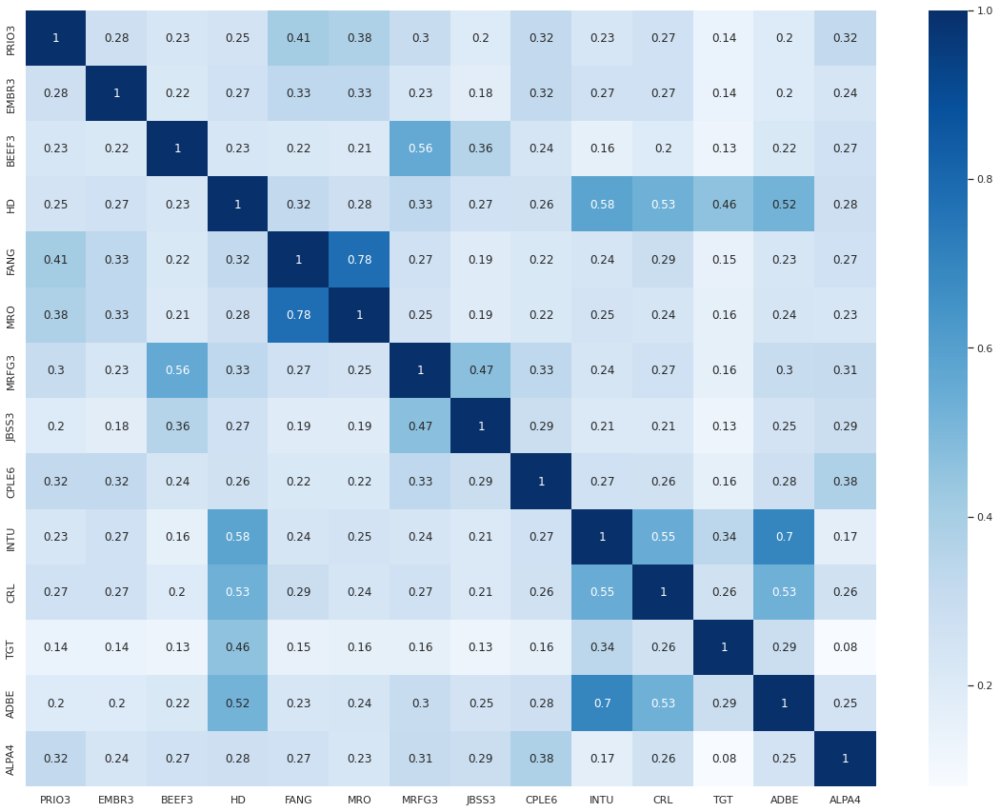

In [543]:
plt.figure(figsize = (20, 15))
sns.heatmap(round(correlacao,2), annot = True, cmap = "Blues")

<Figure size 1440x1080 with 0 Axes>

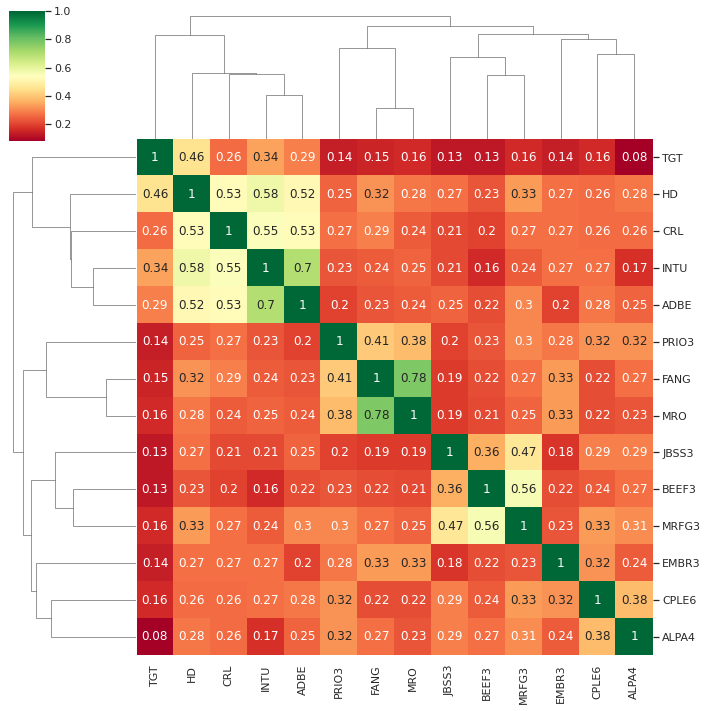

In [544]:
plt.figure(figsize = (20, 15))
sns.clustermap(round(correlacao,2), annot = True, cmap="RdYlGn")
plt.show()

### Tree Graphs

In [545]:
#convert matrix to list of edges and rename the columns
edges = correlacao.stack().reset_index()
edges.columns = ['Ticker_1','Ticker_2','correlation']

#remove self correlations
edges = edges.loc[edges['Ticker_1'] != edges['Ticker_2']].copy()
edges

,Ticker_1,Ticker_2,correlation
1,PRIO3,EMBR3,0.284322
2,PRIO3,BEEF3,0.233905
3,PRIO3,HD,0.254641
4,PRIO3,FANG,0.407758
5,PRIO3,MRO,0.380516
...,...,...,...
190,ALPA4,CPLE6,0.375640
191,ALPA4,INTU,0.174472
192,ALPA4,CRL,0.259175
193,ALPA4,TGT,0.082173


In [546]:
mean_correlation = edges['correlation'].mean()
mean_correlation

0.283895620842214

In [547]:
#create undirected graph with weights corresponding to the correlation magnitude
G0 = nx.from_pandas_edgelist(edges, 'Ticker_1', 'Ticker_2', edge_attr=['correlation'])

#print out the graph info
#check number of nodes and degrees are as expected (all should have degree = 38, i.e. average degree = 38)
print(nx.info(G0))

Graph with 14 nodes and 91 edges


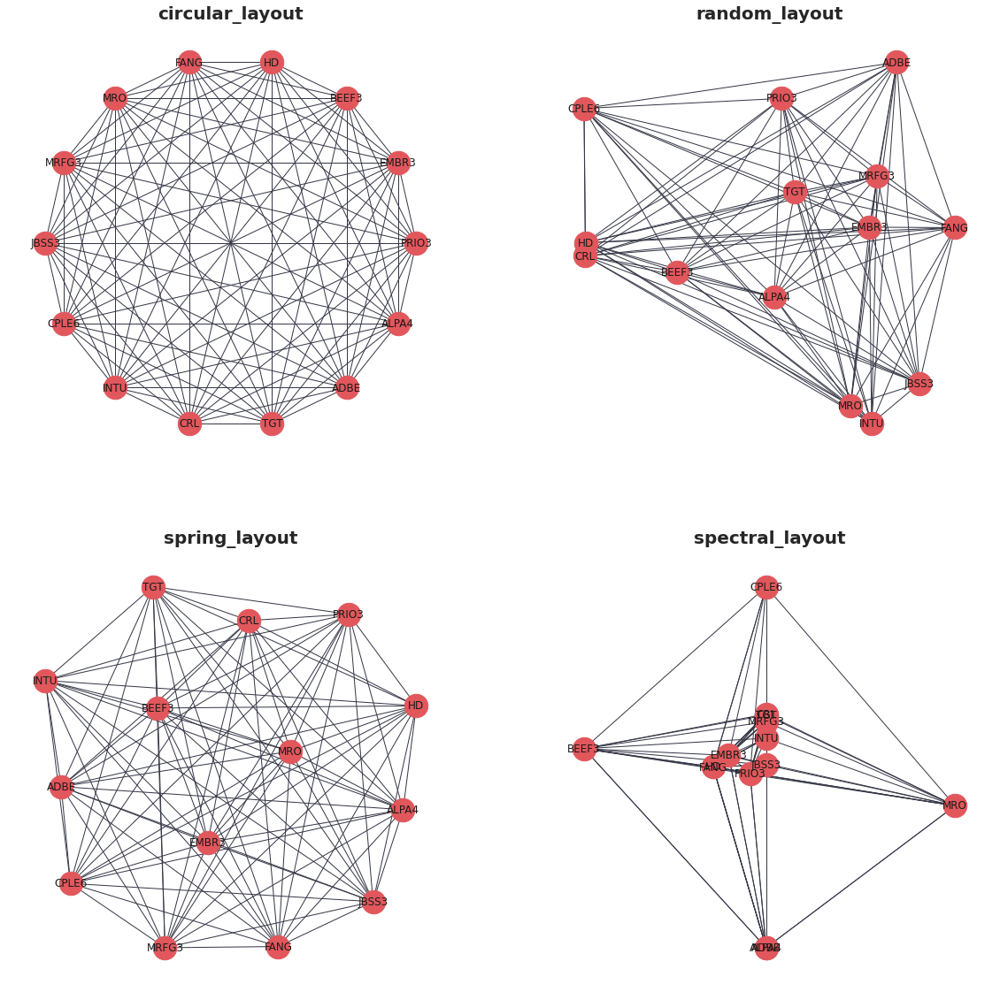

In [548]:
# create subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))

# save different layout functions in a list
layouts = [nx.circular_layout, nx.random_layout, nx.spring_layout, nx.spectral_layout]

# plot each different layout
for layout, ax in zip(layouts, axs.ravel()):
    nx.draw(
        G0,
        with_labels=True,
        node_size=700,
        node_color="#e1575c",
        edge_color="#363847",
        pos=layout(G0),
        ax=ax,
    )
    ax.set_title(layout.__name__, fontsize=20, fontweight="bold")

plt.show()


**Perguntas**
*   Quais ativos mostram as correlações mais fortes/significativas (ou seja, >0,5) entre si?
*   Essas correlações são positivas ou negativas?
*   Quais são os ativos mais/menos 'conectados'? (ou seja, quais ativos compartilham as correlações mais/menos fortes com outros ativos no conjunto de dados)
*   Quais grupos de ativos se comportam de maneira semelhante? (ou seja, quais ativos estão correlacionados com o mesmo tipo de outros ativos)

**Objetivo**
*   Reduzir o número de conexões entre nós filtrando conexões abaixo de um determinado valor limite para a força da correlação
*   Introduzir cor para significar correlações positivas ou negativas
*   Dimensionar a espessura da borda para indicar a magnitude da correlação
*   Dimensionar o tamanho dos nós para indicar quais ativos têm o maior número de correlações fortes com o restante dos ativos no conjunto de dados


In [549]:
# 'winner takes all' method - set minimum correlation threshold to remove some
# edges from the diagram
threshold = mean_correlation

# create a new graph from edge list
Gx = nx.from_pandas_edgelist(edges, "Ticker_1", "Ticker_2", edge_attr=["correlation"])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for Ticker_1, Ticker_2 in Gx.edges():
    corr = Gx[Ticker_1][Ticker_2]["correlation"]
    # add to remove node list if abs(corr) < threshold
    if abs(corr) < threshold:
        remove.append((Ticker_1, Ticker_2))

# remove edges contained in the remove list
Gx.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")

60 edges removed


In [550]:
def assign_colour(correlation):
    if correlation <= 0:
        return "#800000"  # red
    else:
        return "#006400"  # green


def assign_thickness(correlation, benchmark_thickness=2, scaling_factor=3):
    return benchmark_thickness * abs(correlation) ** scaling_factor


def assign_node_size(degree, scaling_factor=50):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for key, value in nx.get_edge_attributes(Gx, "correlation").items():
    edge_colours.append(assign_colour(value))
    edge_width.append(assign_thickness(value))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(Gx.degree).items():
    node_size.append(assign_node_size(value))

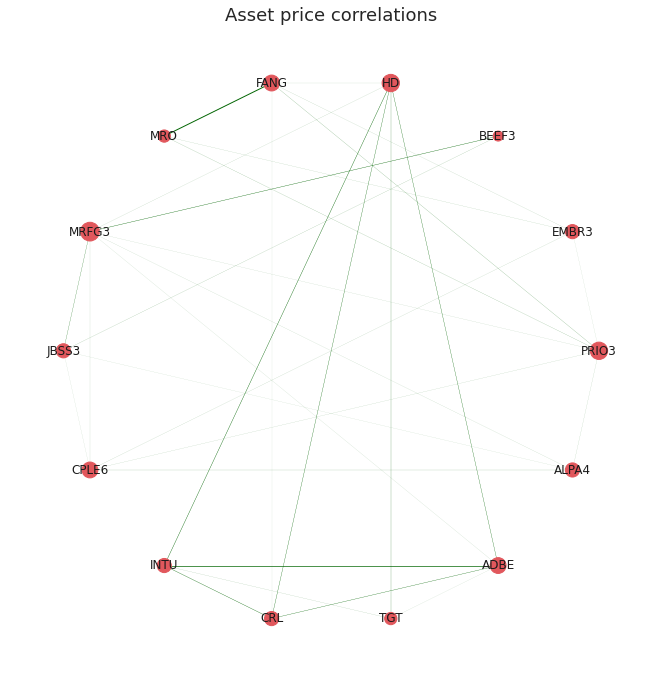

In [551]:
# draw improved graph
sns.set(rc={"figure.figsize": (9, 9)})
font_dict = {"fontsize": 18}

nx.draw(
    Gx,
    pos=nx.circular_layout(Gx),
    with_labels=True,
    node_size=node_size,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=edge_width,
)
plt.title("Asset price correlations", fontdict=font_dict)
plt.show()

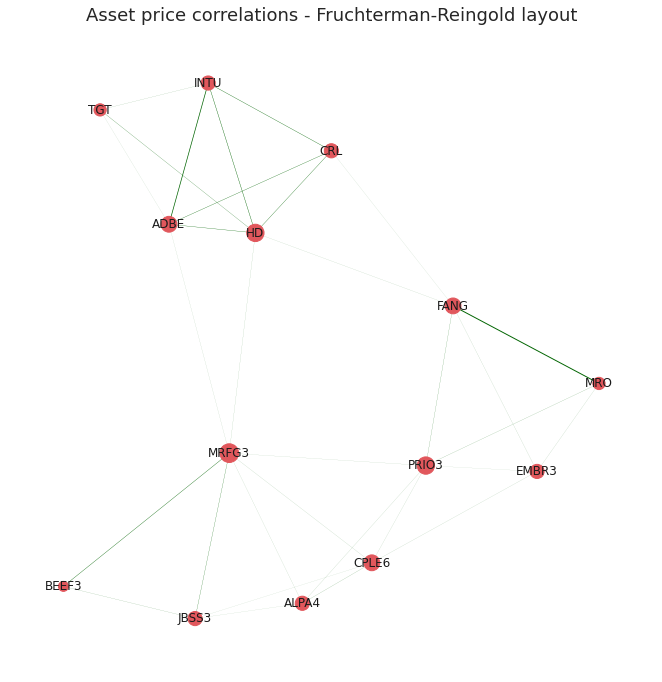

In [552]:
# draw improved graph
nx.draw(
    Gx,
    pos=nx.fruchterman_reingold_layout(Gx),
    with_labels=True,
    node_size=node_size,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=edge_width,
)
plt.title("Asset price correlations - Fruchterman-Reingold layout", fontdict=font_dict)
plt.show()

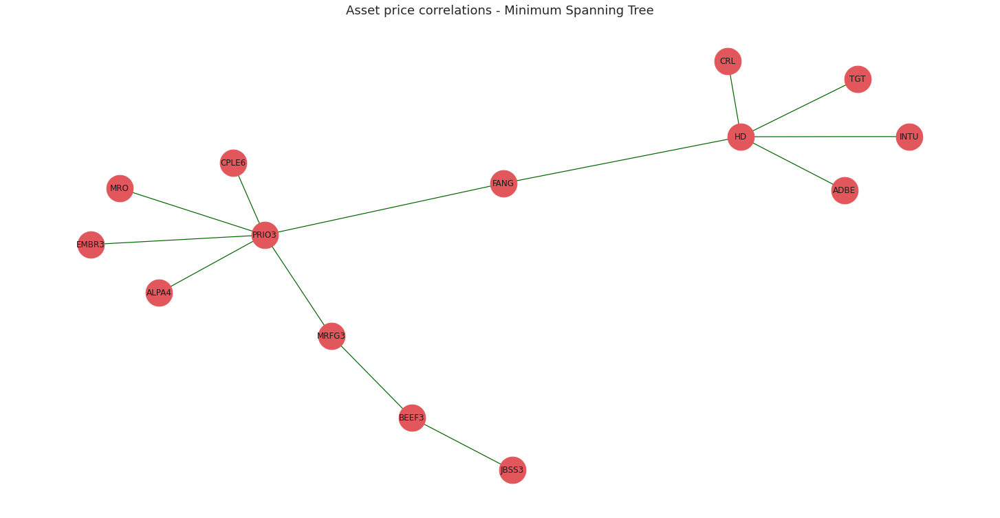

In [553]:
# create minimum spanning tree layout from Gx
# (after small correlations have been removed)

plt.figure(figsize = (20, 10))
mst = nx.minimum_spanning_tree(Gx)

edge_colours = []

# assign edge colours
for key, value in nx.get_edge_attributes(mst, "correlation").items():
    edge_colours.append(assign_colour(value))


# draw minimum spanning tree. Set node size and width to constant
nx.draw(
    mst,
    with_labels=True,
    pos=nx.fruchterman_reingold_layout(mst),
    node_size=1500,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=1.2,
)

# set title
plt.title("Asset price correlations - Minimum Spanning Tree", fontdict=font_dict)
plt.show()

In [554]:
def convert_rankings_to_string(ranking):
    """
    Concatenate list of nodes and correlations into a single html
    string (required format for the plotly tooltip)

    Inserts html "<br>" inbetween each item in order to add a new
    line in the tooltip
    """
    s = ""
    for r in ranking:
        s += r + "<br>"
    return s


def calculate_stats(returns=log_returns):
    """calculate annualised returns and volatility for all ETFs

    Returns:
        tuple: Outputs the annualised volatility and returns as a list of
            floats (for use in assigning node colours and sizes) and also
            as a lists of formatted strings to be used in the tool tips.
    """

    # log returns are additive, 252 trading days
    annualized_returns = list(np.mean(returns) * 252 * 100)

    annualized_volatility = [
        np.std(returns[col] * 100) * (252 ** 0.5) for col in list(returns.columns)
    ]

    # create string for tooltip
    annualized_volatility_2dp = [
        "Annualized Volatility: " "%.1f" % r + "%" for r in annualized_volatility
    ]
    annualized_returns_2dp = [
        "Annualized Returns: " "%.1f" % r + "%" for r in annualized_returns
    ]

    return (
        annualized_volatility,
        annualized_returns,
        annualized_volatility_2dp,
        annualized_returns_2dp,
    )


def get_top_and_bottom_three(df=correlacao):
    """
    get a list of the top 3 and bottom 3 most/least correlated assests
    for each node.

    Args:
        df (pd.DataFrame): pandas correlation matrix

    Returns:
        top_3_list (list): list of lists containing the top 3 correlations
            (name and value)
        bottom_3_list (list): list of lists containing the bottom three
            correlations (name and value)
    """

    top_3_list = []
    bottom_3_list = []

    for col in df.columns:

        # exclude self correlation #reverse order of the list returned
        top_3 = list(np.argsort(abs(df[col]))[-4:-1][::-1])
        # bottom 3 list is returned in correct order
        bottom_3 = list(np.argsort(abs(df[col]))[:3])

        # get column index
        col_index = df.columns.get_loc(col)

        # find values based on index locations
        top_3_values = [df.index[x] + ": %.2f" % df.iloc[x, col_index] for x in top_3]
        bottom_3_values = [
            df.index[x] + ": %.2f" % df.iloc[x, col_index] for x in bottom_3
        ]

        top_3_list.append(convert_rankings_to_string(top_3_values))
        bottom_3_list.append(convert_rankings_to_string(bottom_3_values))

    return top_3_list, bottom_3_list

In [555]:
def get_coordinates(G=mst):
    """Returns the positions of nodes and edges in a format
    for Plotly to draw the network
    """
    # get list of node positions
    pos = nx.fruchterman_reingold_layout(mst)

    Xnodes = [pos[n][0] for n in mst.nodes()]
    Ynodes = [pos[n][1] for n in mst.nodes()]

    Xedges = []
    Yedges = []
    for e in mst.edges():
        # x coordinates of the nodes defining the edge e
        Xedges.extend([pos[e[0]][0], pos[e[1]][0], None])
        Yedges.extend([pos[e[0]][1], pos[e[1]][1], None])

    return Xnodes, Ynodes, Xedges, Yedges

In [556]:
# get statistics for tooltip

# make list of node labels.
node_label = list(mst.nodes())
# calculate annualised returns, annualised volatility and round to 2dp
annual_vol, annual_ret, annual_vol_2dp, annual_ret_2dp = calculate_stats()
# get top and bottom 3 correlations for each node
top_3_corrs, bottom_3_corrs = get_top_and_bottom_three()


# create tooltip string by concatenating statistics
description = [
    f"<b>{node}</b>"
    + "<br>"
    + annual_ret_2dp[index]
    + "<br>"
    + annual_vol_2dp[index]
    + "<br><br>Strongest correlations with: "
    + "<br>"
    + top_3_corrs[index]
    + "<br>Weakest correlations with: "
    "<br>" + bottom_3_corrs[index]
    for index, node in enumerate(node_label)
]

# get coordinates for nodes and edges
Xnodes, Ynodes, Xedges, Yedges = get_coordinates()

# assign node colour depending on positive or negative annualised returns
node_colour = [assign_colour(i) for i in annual_ret]

# assign node size based on annualised returns size (scaled by a factor)
node_size = [abs(x) ** 0.5 * 5 for x in annual_ret]

In [557]:
# Plot graph

# edges
tracer = go.Scatter(
    x=Xedges,
    y=Yedges,
    mode="lines",
    line=dict(color="#DCDCDC", width=1),
    hoverinfo="none",
    showlegend=False,
)


# nodes
tracer_marker = go.Scatter(
    x=Xnodes,
    y=Ynodes,
    mode="markers+text",
    textposition="top center",
    marker=dict(size=node_size, line=dict(width=1), color=node_colour),
    hoverinfo="text",
    hovertext=description,
    text=node_label,
    textfont=dict(size=15),
    showlegend=False,
)


axis_style = dict(
    title="",
    titlefont=dict(size=20),
    showgrid=False,
    zeroline=False,
    showline=False,
    ticks="",
    showticklabels=False,
)


layout = dict(
    title="Minimum Spanning Tree",
    width=1200,
    height=700,
    autosize=False,
    showlegend=False,
    xaxis=axis_style,
    yaxis=axis_style,
    hovermode="closest",
    plot_bgcolor="#fff",
)


fig = go.Figure()
fig.add_trace(tracer)
fig.add_trace(tracer_marker)
fig.update_layout(layout)

fig.show()

display(
    HTML(
        """
        <p>Node sizes are proportional to the size of
        annualised returns.<br>Node colours signify positive
        or negative returns since beginning of the timeframe.</p>
        """
    )
)

##### Grau de Centralidade

In [558]:
deg_centrality = nx.degree_centrality(Gx)
deg_centrality = pd.DataFrame(deg_centrality.items(), columns=['Ticker', 'Grau de Centralidade']).sort_values(by='Grau de Centralidade', ascending = False)
deg_centrality

,Ticker,Grau de Centralidade
6,MRFG3,0.538462
0,PRIO3,0.461538
3,HD,0.461538
4,FANG,0.384615
8,CPLE6,0.384615
12,ADBE,0.384615
1,EMBR3,0.307692
7,JBSS3,0.307692
9,INTU,0.307692
10,CRL,0.307692


In [559]:
pr = nx.pagerank(Gx, alpha = 0.8)
pr

{'ADBE': 0.07889478317590366,
 'ALPA4': 0.06479126247479607,
 'BEEF3': 0.04004741242512198,
 'CPLE6': 0.07832852486139884,
 'CRL': 0.06498762482373903,
 'EMBR3': 0.06555740824146519,
 'FANG': 0.07877891748564622,
 'HD': 0.09187275439837651,
 'INTU': 0.0661245186627392,
 'JBSS3': 0.0679637985646805,
 'MRFG3': 0.10647243452774362,
 'MRO': 0.05221309002872276,
 'PRIO3': 0.09158436095286579,
 'TGT': 0.05238310937680032}

###Test Graph Community
Disponível em: (https://devmessias.github.io/post/nsbm_sp500_stock_market_disparity_filter/)

####Cruzamento

In [560]:
df_cluster = pd.read_excel('/content/drive/MyDrive/IC ITA/Projeto de Pesquisa - IC ITA/Resultados/Ativos melhor cluster.xlsx').set_index('Código')
df_cluster

,Setor NAICS,Sharpe Ratio,Indice,Quarter
Código,,,,
PRIO3,"Mineração, exploração de pedreiras e extração ...",0.057163,Ibov,3T2021
EMBR3,Indústria manufatureira,0.050496,Ibov,3T2021
BEEF3,Indústria manufatureira,0.040166,Ibov,3T2021
HD,Comércio varejista,0.030157,S&P500,3T2021
FANG,"Mineração, exploração de pedreiras e extração ...",0.030152,S&P500,3T2021
MRO,"Mineração, exploração de pedreiras e extração ...",0.030147,S&P500,3T2021
MRFG3,Indústria manufatureira,0.107206,Ibov,3T2021
JBSS3,Indústria manufatureira,0.075849,Ibov,3T2021
CPLE6,"Empresa de eletricidade, gás e água",0.060478,Ibov,3T2021


In [561]:
all_symbols = df_cluster.index.values
all_sectors = df_cluster['Setor NAICS'].values

symbol2sector = dict(zip(all_symbols, all_sectors))

In [562]:
symbol2sector

{'ADBE': 'Informação',
 'ALPA4': 'Indústria manufatureira',
 'BEEF3': 'Indústria manufatureira',
 'CPLE6': 'Empresa de eletricidade, gás e água',
 'CRL': 'Serviços profissionais, científicos e técnicos',
 'EMBR3': 'Indústria manufatureira',
 'FANG': 'Mineração, exploração de pedreiras e extração de petróleo e gás',
 'HD': 'Comércio varejista',
 'INTU': 'Informação',
 'JBSS3': 'Indústria manufatureira',
 'MRFG3': 'Indústria manufatureira',
 'MRO': 'Mineração, exploração de pedreiras e extração de petróleo e gás',
 'PRIO3': 'Mineração, exploração de pedreiras e extração de petróleo e gás',
 'TGT': 'Comércio varejista'}

####Build Graph

In [563]:
pos_correlation = correlacao.copy()
# vamos considerar apenas as correlações positivas pois queremos 
# apenas as comunidades
pos_correlation[pos_correlation < 0] = 0
# diagonal principal é setada a 0 para evitar auto-arestas
np.fill_diagonal(pos_correlation.values, 0)

In [564]:
g = ig.Graph.Weighted_Adjacency(pos_correlation.values, mode='undirected')
# criamos uma feature symbol para cada vértice
g.vs["symbol"] = log_returns.columns
# o grafo pode estar desconectado. Portanto, extraímos a componente gigante
cl = g.clusters()
g = cl.giant()
n_edges_before = g.ecount()

In [565]:
_ = filter_ig_graph(g, 0.9,cond="both", field="weight") #no filter disparidade
cl = g.clusters()
g = cl.giant()
n_edges_after = g.ecount()

In [566]:
g.vs["symbol"]

['PRIO3',
 'EMBR3',
 'BEEF3',
 'HD',
 'FANG',
 'MRO',
 'MRFG3',
 'JBSS3',
 'CPLE6',
 'INTU',
 'CRL',
 'TGT',
 'ADBE',
 'ALPA4']

In [567]:
print(f"Percentage of edges removed: {(n_edges_before - n_edges_after)/n_edges_before*100:.2f}%")
print(f"Number of remained stocks: {len(symbols)}")

Percentage of edges removed: 0.00%
Number of remained stocks: 15


In [568]:
import graph_tool.all as gt

gnsbm = gt.Graph(directed=False)

# iremos adicionar os vértices
for v in g.vs:
  gnsbm.add_vertex()
# e as arestas
for e in g.es:
  gnsbm.add_edge(e.source, e.target)

In [569]:
state = gt.minimize_nested_blockmodel_dl(gnsbm)

In [570]:
symbols = g.vs["symbol"]
sectors = [symbol2sector[symbol] for symbol in symbols]
u_sectors = np.sort(np.unique(sectors))
u_colors = [plt.cm.tab10(i/len(u_sectors)) for i in range(len(u_sectors))]

# a primeira cor da lista era muito similar a segunda,
u_colors[0] = [0, 1, 0, 1]
sector2color = {sector: color for sector, color in zip(u_sectors, u_colors)}

rgba = gnsbm.new_vertex_property("vector<double>")
gnsbm.vertex_properties['rgba'] = rgba

for i, symbol in enumerate(symbols):
  c = sector2color[symbol2sector[symbol]]
  rgba[i] = [c[0], c[1], c[2], .5]

In [571]:
options = {
    'output': f'nsbm_{inicio}_{fim}.png',
    'beta': 1,
    'bg_color': 'w',
    'output_size': (1500, 1500),
    'vertex_color': gnsbm.vertex_properties['rgba'],
    'vertex_fill_color': gnsbm.vertex_properties['rgba'],
    'hedge_pen_width': 2,
    'hvertex_fill_color': np.array([0., 0., 0., .5]),
    'hedge_color': np.array([0., 0., 0., .5]),
    'hedge_marker_size': 20, 
    'hvertex_size':20   
}

state.draw(**options)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8b78494710, at 0x7f8b78a24910>,
 <GraphView object, directed, with 15 vertices and 14 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7f8b77de5390, at 0x7f8ba0198590>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7f8b77de5390, at 0x7f8b792c2a10>, False), at 0x7f8b77de5390>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8b77de5390, at 0x7f8b792c23d0>)

In [572]:
list(sector2color.keys())

['Comércio varejista',
 'Empresa de eletricidade, gás e água',
 'Indústria manufatureira',
 'Informação',
 'Mineração, exploração de pedreiras e extração de petróleo e gás',
 'Serviços profissionais, científicos e técnicos']

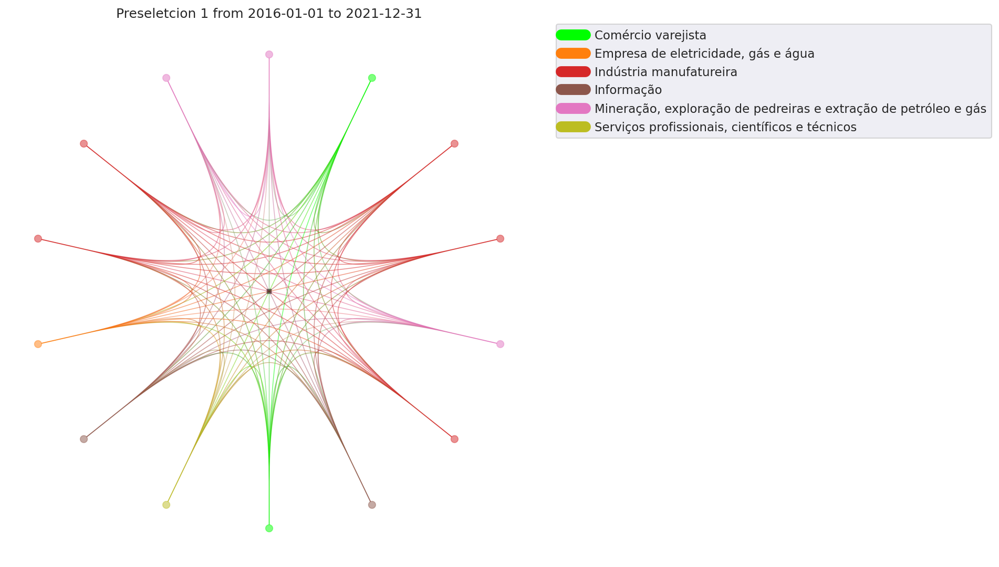

In [573]:
plt.figure(dpi=150)
plt.title(f"Preseletcion 1 from {inicio} to {fim}")
legend = plt.legend([plt.Line2D([0], [0], color=c, lw=10) for c in list(sector2color.values())],list(sector2color.keys()),bbox_to_anchor=(1.05, 1),loc=2,borderaxespad=0.)

plt.imshow(plt.imread(f'nsbm_{inicio}_{fim}.png'))
plt.xticks([])
plt.yticks([])
plt.axis('off')

plt.savefig(f'nsbm_final_{inicio}_{fim}.png', bbox_inches='tight',dpi=150, bbox_extra_artists=(legend,), facecolor='w', edgecolor='w')
plt.show()

#### MST

In [574]:
dist_matrix = np.sqrt(2*(1-correlacao))
dist_matrix = dist_matrix.fillna(0)
np.fill_diagonal(dist_matrix.values, 0)

In [575]:
g = ig.Graph.Weighted_Adjacency(dist_matrix.values, mode='undirected')
g = g.spanning_tree(weights="weight", return_tree=True)
g.vs["symbol"] = log_returns.columns

sectors = [symbol2sector[symbol] for symbol in df_cluster.index]
colors = [
    sector2color[sector] for sector in sectors
]

In [576]:
sectors = [symbol2sector[symbol] for symbol in log_returns.columns]
colors = [
    sector2color[sector] for sector in sectors
]

In [577]:
g.vs["color"] = colors

pos = g.layout_fruchterman_reingold(niter=10000, weights="weight")
pos = np.array(pos.coords)

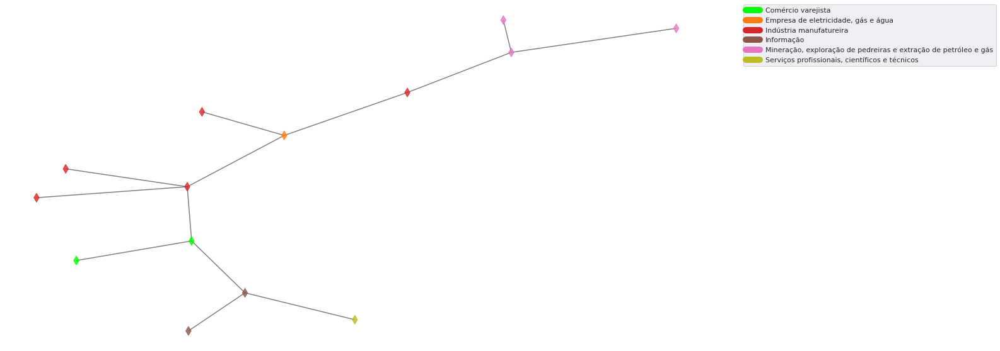

In [578]:
from matplotlib.collections import LineCollection

lines = []
colors = []
for s, t in g.get_edgelist():
    x0, y0 = pos[s]
    x1, y1 = pos[t]
    lines.append([(x0, y0), (x1, y1)])
    colors.append("black")
lc = LineCollection(lines, colors=colors, zorder=0, alpha=.5)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1, 1, 1)
ax.scatter(
    pos[:, 0],
    pos[:, 1],
    c=g.vs["color"],
    s=100,
    marker="d",
    alpha=.8,
    zorder=1
)
ax.add_collection(lc)
ax.axis('off')
legend = ax.legend(
    [plt.Line2D([0], [0], color=c, lw=10)
        for c in list(sector2color.values())],
    list(sector2color.keys()),
    bbox_to_anchor=(1.05, 1),
    loc=2,
    borderaxespad=0.)
plt.savefig(f'mst_{inicio}_{fim}.png', bbox_inches='tight',)
plt.show()

### Covariance Matrix

In [579]:
covariancia = log_returns.cov()
covariancia

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
PRIO3,0.002176,0.000406,0.000283,0.000187,0.000700,0.000689,0.000406,0.000312,0.000372,0.000194,0.000255,0.000124,0.000187,0.000398
EMBR3,0.000406,0.000937,0.000171,0.000132,0.000367,0.000387,0.000203,0.000178,0.000248,0.000151,0.000164,0.000081,0.000120,0.000193
BEEF3,0.000283,0.000171,0.000671,0.000093,0.000208,0.000216,0.000417,0.000306,0.000158,0.000076,0.000106,0.000062,0.000114,0.000183
HD,0.000187,0.000132,0.000093,0.000248,0.000184,0.000171,0.000149,0.000137,0.000103,0.000166,0.000165,0.000136,0.000164,0.000116
FANG,0.000700,0.000367,0.000208,0.000184,0.001356,0.001120,0.000289,0.000226,0.000201,0.000165,0.000212,0.000103,0.000166,0.000260
MRO,0.000689,0.000387,0.000216,0.000171,0.001120,0.001508,0.000285,0.000241,0.000218,0.000179,0.000190,0.000115,0.000189,0.000234
MRFG3,0.000406,0.000203,0.000417,0.000149,0.000289,0.000285,0.000829,0.000443,0.000235,0.000128,0.000154,0.000089,0.000172,0.000235
JBSS3,0.000312,0.000178,0.000306,0.000137,0.000226,0.000241,0.000443,0.001071,0.000235,0.000127,0.000137,0.000081,0.000162,0.000248
CPLE6,0.000372,0.000248,0.000158,0.000103,0.000201,0.000218,0.000235,0.000235,0.000628,0.000123,0.000131,0.000075,0.000138,0.000248
INTU,0.000194,0.000151,0.000076,0.000166,0.000165,0.000179,0.000128,0.000127,0.000123,0.000335,0.000202,0.000116,0.000256,0.000084


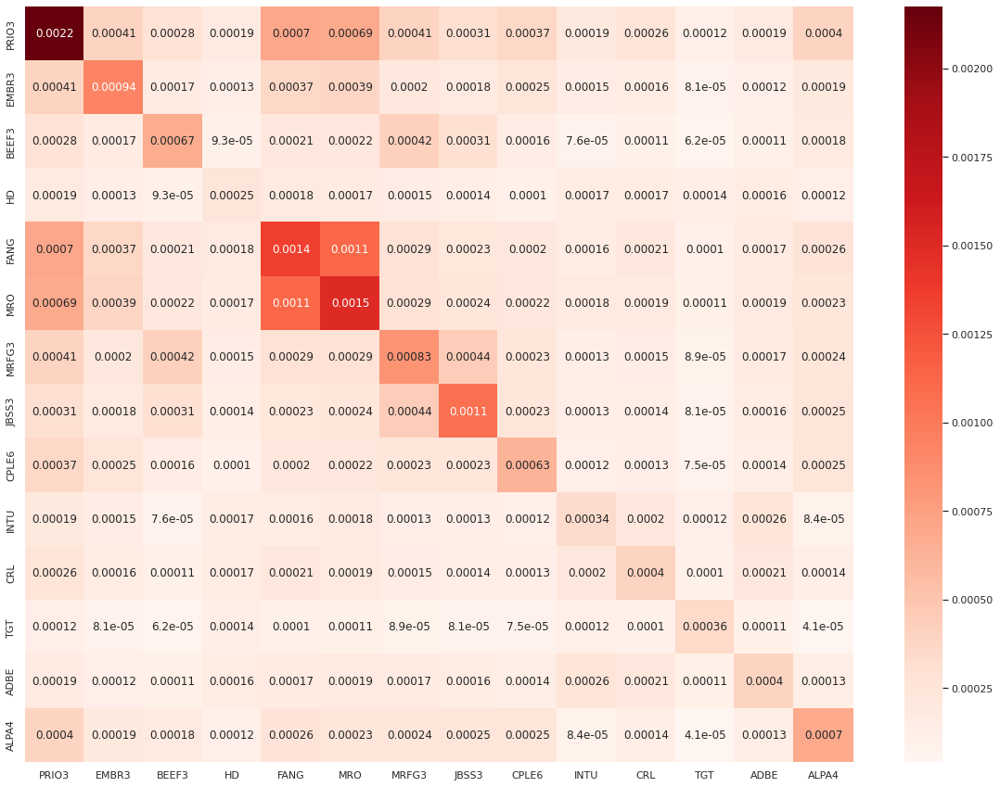

In [580]:
plt.figure(figsize = (20, 15))
sns.heatmap(covariancia, annot = True, cmap = 'Reds')

### Tree Clustering

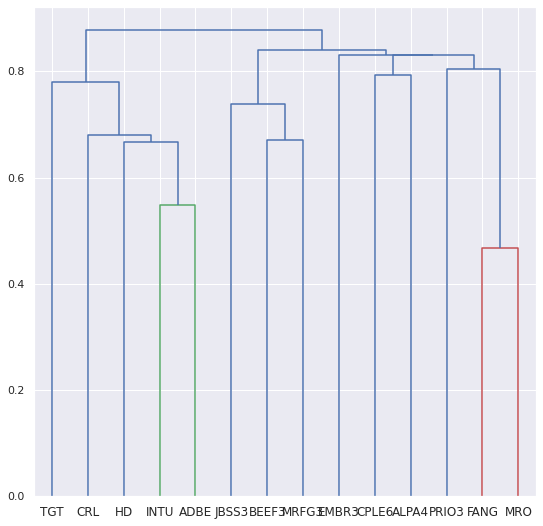

ADBE     0.088920
ALPA4    0.062221
BEEF3    0.066085
CPLE6    0.071830
CRL      0.088455
EMBR3    0.048117
FANG     0.022884
HD       0.142819
INTU     0.104911
JBSS3    0.041375
MRFG3    0.071689
MRO      0.020570
PRIO3    0.019898
TGT      0.150227
dtype: float64

In [581]:
tree = getHRP(covariancia, correlacao)
tree

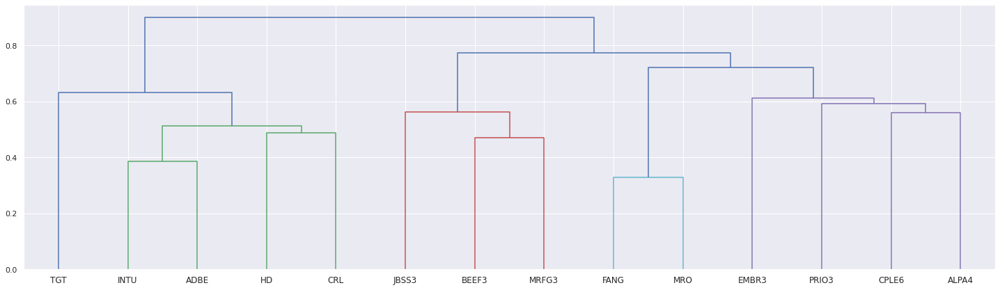

In [582]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

plt.figure(figsize=(25,7))
distances = np.sqrt((1 - correlacao) / 2)
clusters = linkage(squareform(distances), method="ward")

dendrogram(clusters, labels=df.columns);

## Portfolios Optimazed

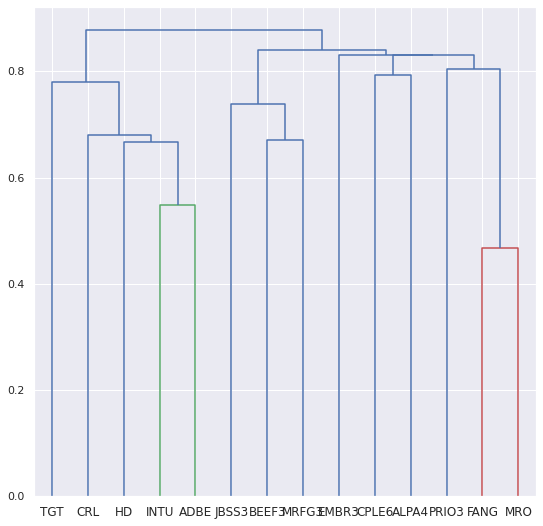

     pcost       dcost       gap    pres   dres
 0: -9.9999e-01 -2.0000e+00  1e+00  1e-15  1e+00
 1: -9.9999e-01 -1.0100e+00  1e-02  1e-16  1e-02
 2: -9.9999e-01 -1.0001e+00  1e-04  2e-16  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  4e-17  1e-05
 4: -9.9999e-01 -1.0000e+00  5e-06  7e-17  8e-17
 5: -9.9999e-01 -9.9999e-01  7e-07  1e-16  4e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9999e-01 -2.0000e+00  1e+00  2e-15  1e+00
 1: -9.9999e-01 -1.0100e+00  1e-02  5e-17  1e-02
 2: -9.9999e-01 -1.0001e+00  1e-04  3e-17  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  5e-17  1e-05
 4: -9.9999e-01 -1.0000e+00  5e-06  3e-17  5e-17
 5: -9.9999e-01 -9.9999e-01  7e-07  7e-17  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9998e-01 -2.0000e+00  1e+00  6e-15  1e+00
 1: -9.9998e-01 -1.0100e+00  1e-02  1e-16  1e-02
 2: -9.9998e-01 -1.0001e+00  1e-04  1e-16  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  4e-17  2e-05
 4: -9.9999e-01 -9.9999e

,MVP,IVP,HRP
TGT,0.239560,0.115052,0.150227
HD,0.236398,0.165237,0.142819
INTU,0.122342,0.121907,0.104911
ADBE,0.035053,0.103325,0.088920
CRL,0.069920,0.102340,0.088455
CPLE6,0.068049,0.065130,0.071830
MRFG3,0.004854,0.049346,0.071689
BEEF3,0.100080,0.060987,0.066085
ALPA4,0.075504,0.058781,0.062221
EMBR3,0.024711,0.043629,0.048117


In [326]:
portfolios = get_all_portfolios(log_returns)
portfolios

###Join Dataframes - Sectors

In [327]:
df_cluster = pd.read_excel('/content/drive/MyDrive/IC ITA/Projeto de Pesquisa - IC ITA/Resultados/Ativos melhor cluster.xlsx').set_index('Código')
df_cluster

,Setor NAICS,Sharpe Ratio,Indice,Quarter
Código,,,,
PRIO3,"Mineração, exploração de pedreiras e extração ...",0.057163,Ibov,3T2021
EMBR3,Indústria manufatureira,0.050496,Ibov,3T2021
BEEF3,Indústria manufatureira,0.040166,Ibov,3T2021
HD,Comércio varejista,0.030157,S&P500,3T2021
FANG,"Mineração, exploração de pedreiras e extração ...",0.030152,S&P500,3T2021
MRO,"Mineração, exploração de pedreiras e extração ...",0.030147,S&P500,3T2021
MRFG3,Indústria manufatureira,0.107206,Ibov,3T2021
JBSS3,Indústria manufatureira,0.075849,Ibov,3T2021
CPLE6,"Empresa de eletricidade, gás e água",0.060478,Ibov,3T2021


In [328]:
portfolios = portfolios.merge(df_cluster, left_index = True, right_index = True)
portfolios = portfolios[['MVP','IVP','HRP','Setor NAICS','Indice']]
portfolios

,MVP,IVP,HRP,Setor NAICS,Indice
TGT,0.239560,0.115052,0.150227,Comércio varejista,S&P500
HD,0.236398,0.165237,0.142819,Comércio varejista,S&P500
INTU,0.122342,0.121907,0.104911,Informação,S&P500
ADBE,0.035053,0.103325,0.088920,Informação,S&P500
CRL,0.069920,0.102340,0.088455,"Serviços profissionais, científicos e técnicos",S&P500
CPLE6,0.068049,0.065130,0.071830,"Empresa de eletricidade, gás e água",Ibov
MRFG3,0.004854,0.049346,0.071689,Indústria manufatureira,Ibov
BEEF3,0.100080,0.060987,0.066085,Indústria manufatureira,Ibov
ALPA4,0.075504,0.058781,0.062221,Indústria manufatureira,Ibov
EMBR3,0.024711,0.043629,0.048117,Indústria manufatureira,Ibov


#### EDA

In [329]:
sum_sector = pd.DataFrame(portfolios.groupby(portfolios['Setor NAICS']).sum())
sum_sector

,MVP,IVP,HRP
Setor NAICS,,,
Comércio varejista,0.475957,0.280289,0.293045
"Empresa de eletricidade, gás e água",0.068049,0.065130,0.071830
Indústria manufatureira,0.217363,0.250926,0.289487
Informação,0.157395,0.225232,0.193830
"Mineração, exploração de pedreiras e extração de petróleo e gás",0.011316,0.076083,0.063352
"Serviços profissionais, científicos e técnicos",0.069920,0.102340,0.088455


In [330]:
def build_viz(coluna):

  y= round(sum_sector[coluna],3).sort_values(ascending=False)
  x = sum_sector.index

  fig = go.Figure(data=[go.Bar(x = x,
              y=y,
              text=y,
              textposition='auto',
              marker_color = 'blue'
          )])
  fig.update_layout(height=500, width=1200,title_text=coluna)
  fig.show()

In [331]:
for i in sum_sector.columns:
  build_viz(i)

In [332]:
def build_viz_2(coluna):
  fg = pl.sunburst(data_frame = sum_sector*100, path=[sum_sector.index], values = coluna ,title = coluna, height=500, width=1200)
  fg.update_traces(textfont_color = 'white',
                   textfont_size = 14,
                   hovertemplate = '<b>%{label}:</b> %{value:.2f}%')
  fg.show()

In [333]:
for i in sum_sector.columns:
  build_viz_2(i)

### Combine returns and weights in Portfolios

In [334]:
def combine_returns_weights (methods):

  portfolio_order = portfolios.T.iloc[:-2].reindex(columns=log_returns.columns)
  ativos = np.array(log_returns.columns)

  method = [methods]
  portfolio_methods = pd.DataFrame()

  for i in methods:

    pesos = np.array(portfolio_order.loc[i])
    carteira = pd.DataFrame((log_returns * pesos).sum(axis=1)).rename(columns={0:f'Retornos {i}'})

    #Retorno Total da Carteira
    total_return = (((1+carteira).cumprod())-1)*100
    print(f"O retorno total na carteira {i} é igual a " + f"{np.sum(total_return.iloc[-1,:]).round(2)}%")

    #Retorno Anual Esperado
    expected_return_annual = np.sum(carteira.mean()*252)*100
    print(f"O retorno anual na carteira {i} é igual a " + f"{expected_return_annual.round(2)}%")

    #Volatilidade Anual
    carteira_vol = np.sqrt(pesos.T.dot(covariancia*252).dot(pesos))*100
    print(f"A volatilidade anual da carteira {i} é igual a " + f"{carteira_vol.round(2)}%")

    #Sharpe das Carteiras
    sharpe=(expected_return_annual)/carteira_vol #sem considerar o risk free
    print(f"O Sharpe Ratio da carteira {i} é igual a " + f"{sharpe.round(3)}")

    #Max Drawdown
    carteira_acum = (1+carteira).cumprod()
    pico = carteira_acum.expanding(min_periods=1).max()
    dd = (carteira_acum/pico)-1
    drawdown = np.sum(dd.min())*100
    print(f"O MDD da carteira {i} é igual a " + f"{drawdown.round(2)}%")

    #Beta
    Y = carteira.values
    X = bench['Ibovespa'].values
    Z = bench['S&P500'].values

    X = sm.add_constant(X)
    Z = sm.add_constant(Z)

    modelo1 = sm.OLS(Y,X)
    resultado1 = modelo1.fit()
    beta_carteira_ibov = resultado1.params[1]
    beta_carteira_ibov = np.sum(beta_carteira_ibov)

    modelo2 = sm.OLS(Y,Z)
    resultado2 = modelo2.fit()
    beta_carteira_sp500 = resultado2.params[1]
    beta_carteira_sp500 = np.sum(beta_carteira_sp500)

    print(f"O Beta da carteira {i} em relação ao Ibovespa é igual a " + f"{beta_carteira_ibov.round(4)}\nE em relaçao ao S&P500 é igual a " + f"{beta_carteira_sp500.round(4)} \n")

    #Plots
    fig = plt.figure(1)
    plt.subplot(1,3,1)
    pf.plot_annual_returns(carteira)
    pf.plot_annual_returns(carteira)
    plt.subplot(1,3,2)
    pf.plot_monthly_returns_heatmap(carteira)
    plt.subplot(1,3,3)
    pf.plot_return_quantiles(carteira)
    plt.tight_layout()
    fig.set_size_inches(20,5)
    plt.show()

    #Plots
    plt.figure(figsize = (21.54,5))
    pf.plot_drawdown_underwater(carteira);
    plt.show()

    print("\n")

    portfolio_temp = carteira

    if portfolio_methods.empty == True:
      portfolio_methods = portfolio_temp

    else:
      portfolio_methods = pd.merge(portfolio_methods,portfolio_temp,left_index = True, right_index = True)
      portfolio_methods= pd.DataFrame(portfolio_methods)

  #Drawdown 30 dias 
  portfolio_methods['MDD 30d MVP'] = portfolio_methods['Retornos MVP'].rolling(window=30).min()
  portfolio_methods['MDD 30d IVP'] = portfolio_methods['Retornos IVP'].rolling(window=30).min()
  portfolio_methods['MDD 30d HRP'] = portfolio_methods['Retornos HRP'].rolling(window=30).min()

  #Retornos Acumulados
  portfolios_methods_acum = (1+portfolio_methods).cumprod()
  portfolios_methods_acum.iloc[0] = 1
  portfolios_methods_acum = pd.DataFrame(portfolios_methods_acum)

  #Join with Benchmarks
  portfolios_methods_acum = pd.merge(portfolios_methods_acum,bench_acum,left_index = True, right_index = True)

  ##Retorno Total Benchmarks
  ibov = portfolios_methods_acum.loc[portfolios_methods_acum.index[-1], "Ibovespa"]
  ibov = (ibov-1)*100
  sp500 = portfolios_methods_acum.loc[portfolios_methods_acum.index[-1], "S&P500"]
  sp500 = (sp500-1)*100
  print(f"O retorno total do Ibovespa é igual a " + f"{np.sum(ibov).round(2)}%")
  print(f"O retorno total do S&P500 é igual a " + f"{np.sum(sp500).round(2)}%")

  plot = portfolios_methods_acum[['Retornos MVP','Retornos IVP','Retornos HRP','Ibovespa','S&P500']].plot(figsize = (20,10));

  plot2 = portfolio_methods[['MDD 30d MVP','MDD 30d IVP','MDD 30d HRP']].plot(figsize = (19.74,10));

  individual_returns_anualized=log_returns.mean()*252
  individual_returns_anualized= individual_returns_anualized.to_frame()
  individual_returns_anualized.rename(columns={0:"Anual Returns %"}).sort_values(by = "Anual Returns %", ascending=False)

  return portfolio_methods, portfolios_methods_acum, plot, plot2, individual_returns_anualized

O retorno total na carteira MVP é igual a 230.24%
O retorno anual na carteira MVP é igual a 22.28%
A volatilidade anual da carteira MVP é igual a 20.22%
O Sharpe Ratio da carteira MVP é igual a 1.102
O MDD da carteira MVP é igual a -36.9%
O Beta da carteira MVP em relação ao Ibovespa é igual a 0.5014
E em relaçao ao S&P500 é igual a 0.9196 



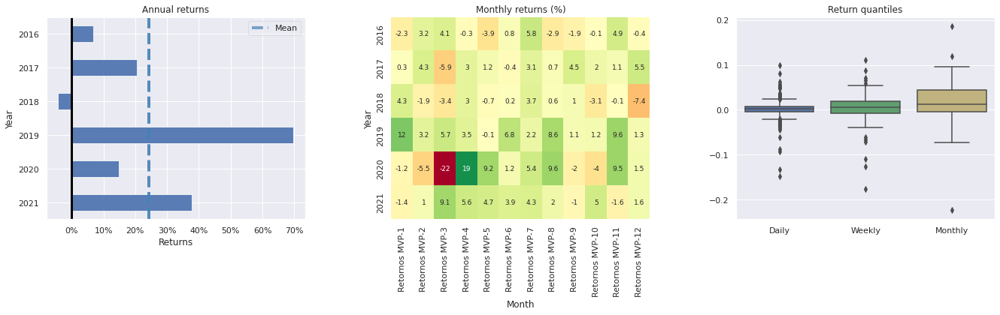

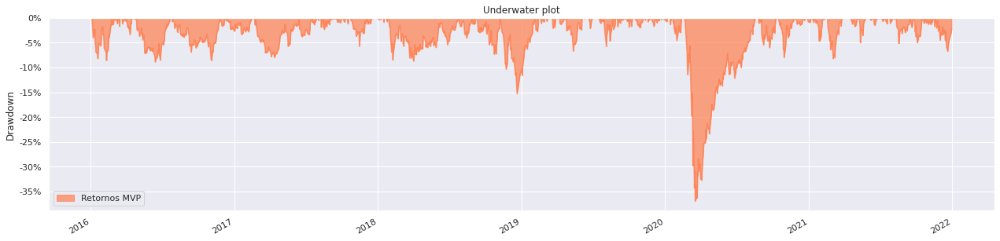



O retorno total na carteira IVP é igual a 250.39%
O retorno anual na carteira IVP é igual a 23.58%
A volatilidade anual da carteira IVP é igual a 21.58%
O Sharpe Ratio da carteira IVP é igual a 1.093
O MDD da carteira IVP é igual a -43.81%
O Beta da carteira IVP em relação ao Ibovespa é igual a 0.5895
E em relaçao ao S&P500 é igual a 1.0232 



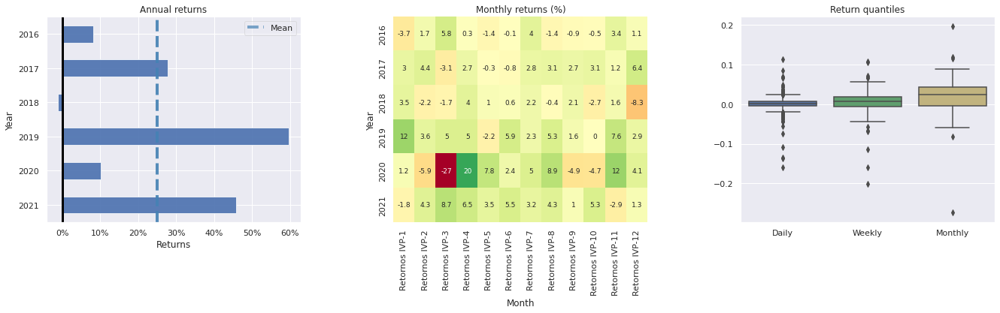

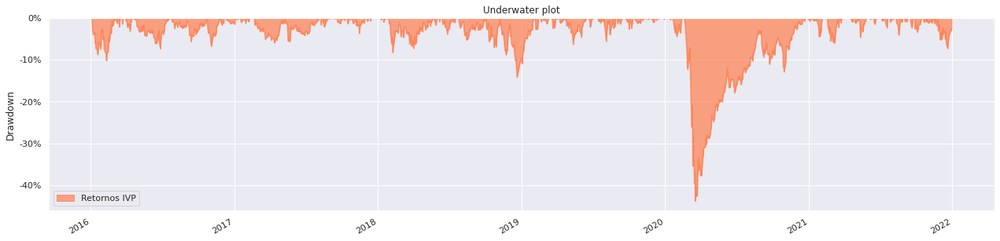



O retorno total na carteira HRP é igual a 246.61%
O retorno anual na carteira HRP é igual a 23.38%
A volatilidade anual da carteira HRP é igual a 21.51%
O Sharpe Ratio da carteira HRP é igual a 1.087
O MDD da carteira HRP é igual a -43.29%
O Beta da carteira HRP em relação ao Ibovespa é igual a 0.5938
E em relaçao ao S&P500 é igual a 0.9922 



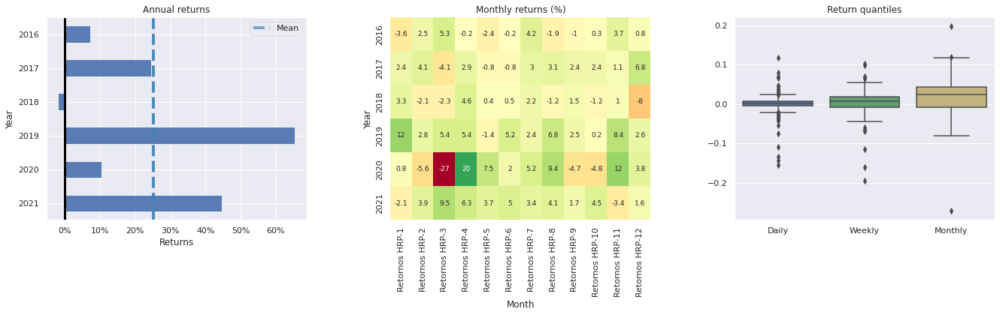

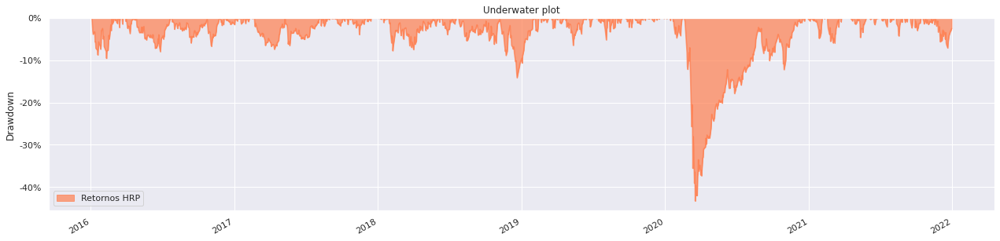



O retorno total do Ibovespa é igual a 99.81%
O retorno total do S&P500 é igual a 114.61%


,Retornos MVP,Retornos IVP,Retornos HRP,MDD 30d MVP,MDD 30d IVP,MDD 30d HRP,Ibovespa,S&P500
Date,,,,,,,,
2016-01-05,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.006575,1.002010
2016-01-06,0.990347,0.978252,0.978270,NaN,NaN,NaN,0.991128,0.988782
2016-01-07,0.974126,0.963305,0.963230,NaN,NaN,NaN,0.965215,0.965065
2016-01-08,0.960985,0.955311,0.955501,NaN,NaN,NaN,0.963245,0.954548
2016-01-11,0.971050,0.958820,0.960755,NaN,NaN,NaN,0.947414,0.955362
...,...,...,...,...,...,...,...,...
2021-12-23,3.219925,3.441226,3.404074,7.728762e-16,4.761499e-16,5.622832e-16,1.999633,2.122506
2021-12-27,3.262050,3.488198,3.444743,7.536443e-16,4.634846e-16,5.473661e-16,2.011797,2.151678
2021-12-28,3.267685,3.486887,3.447176,7.348910e-16,4.511562e-16,5.328447e-16,1.999041,2.149503


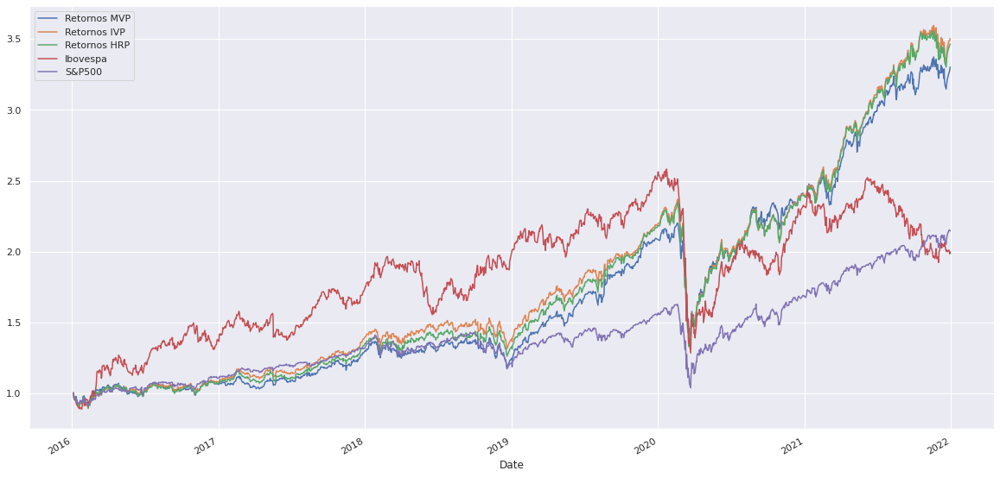

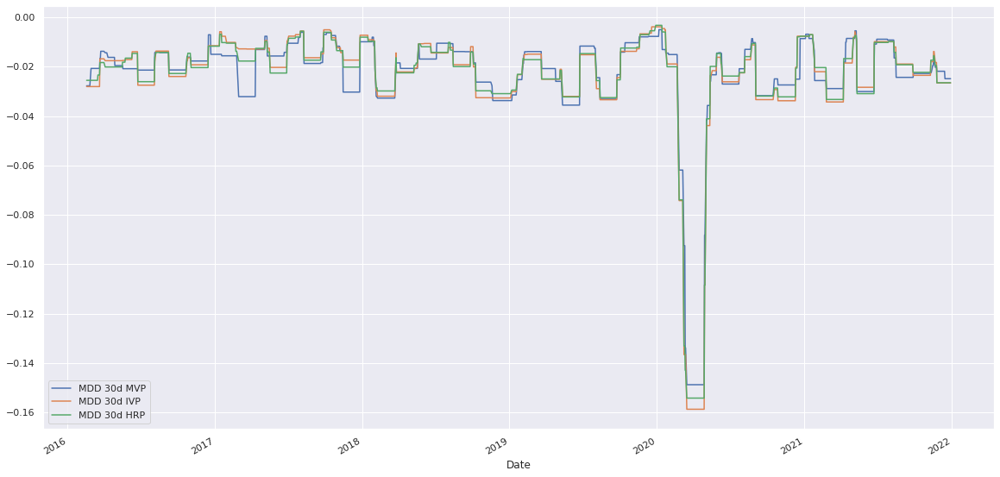

In [335]:
portfolio, portfolios_acum, plot, plot2, individual_returns_anualized = combine_returns_weights(['MVP','IVP','HRP'])
portfolios_acum

In [336]:
individual_returns_anualized

,0
PRIO3,0.760286
EMBR3,-0.023153
BEEF3,0.002209
HD,0.215887
FANG,0.093136
MRO,0.054959
MRFG3,0.244704
JBSS3,0.226989
CPLE6,0.257512
INTU,0.333288


In [337]:
teste = portfolio.merge(bench,left_index=True,right_index=True)

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.374%
Cumulative returns,230.244%
Annual volatility,20.219%
Sharpe ratio,1.10
Calmar ratio,0.61
Stability,0.93
Max drawdown,-36.897%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.90,2020-02-19,2020-03-18,2020-08-19,131
1,15.25,2018-11-07,2018-12-21,2019-02-04,64
2,8.85,2016-04-27,2016-06-14,2016-07-22,63
3,8.70,2018-01-26,2018-04-02,2018-07-25,129
4,8.57,2016-01-05,2016-02-11,2016-02-24,37


Stress Events,mean,min,max
New Normal,0.09%,-14.88%,9.95%


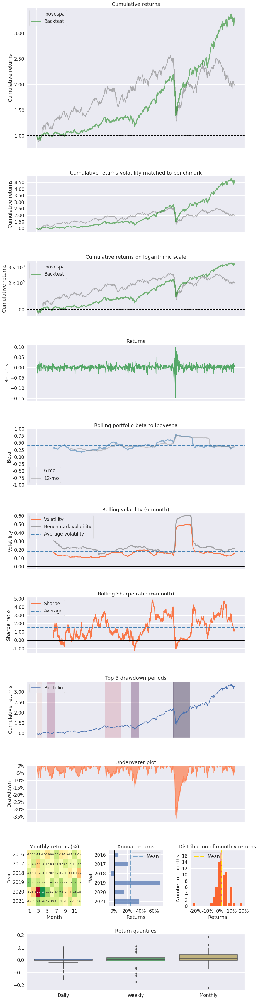

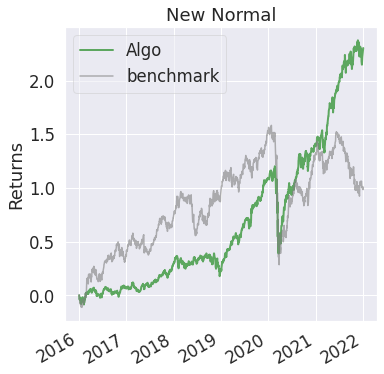

In [338]:
pf.create_full_tear_sheet(teste["Retornos MVP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,23.605%
Cumulative returns,250.392%
Annual volatility,21.583%
Sharpe ratio,1.09
Calmar ratio,0.54
Stability,0.94
Max drawdown,-43.809%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.81,2020-02-19,2020-03-18,2020-12-16,216
1,14.17,2018-11-07,2018-12-21,2019-02-04,64
2,10.18,2016-01-05,2016-02-11,2016-03-02,42
3,8.25,2018-01-26,2018-02-08,2018-06-04,92
4,7.37,2016-04-27,2016-06-27,2016-07-20,61


Stress Events,mean,min,max
New Normal,0.09%,-15.87%,11.31%


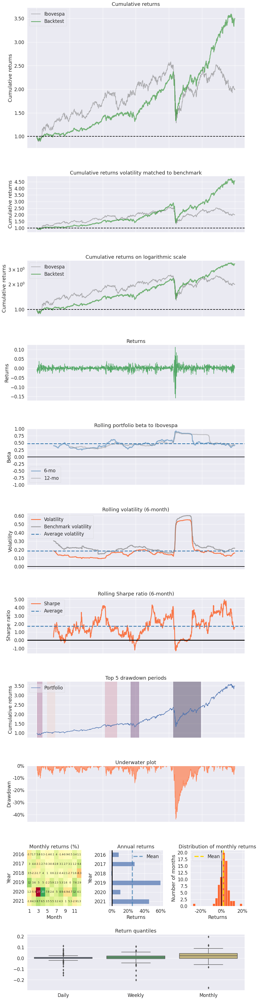

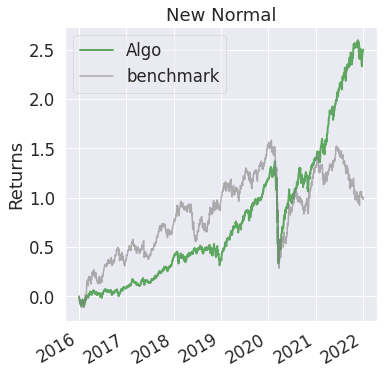

In [339]:
pf.create_full_tear_sheet(teste["Retornos IVP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,23.379%
Cumulative returns,246.606%
Annual volatility,21.509%
Sharpe ratio,1.09
Calmar ratio,0.54
Stability,0.94
Max drawdown,-43.292%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.29,2020-02-19,2020-03-18,2020-12-16,216
1,14.15,2018-11-07,2018-12-21,2019-02-04,64
2,9.55,2016-01-05,2016-02-11,2016-02-25,38
3,7.98,2016-04-27,2016-06-27,2016-07-22,63
4,7.76,2018-01-26,2018-02-08,2018-06-04,92


Stress Events,mean,min,max
New Normal,0.09%,-15.42%,11.72%


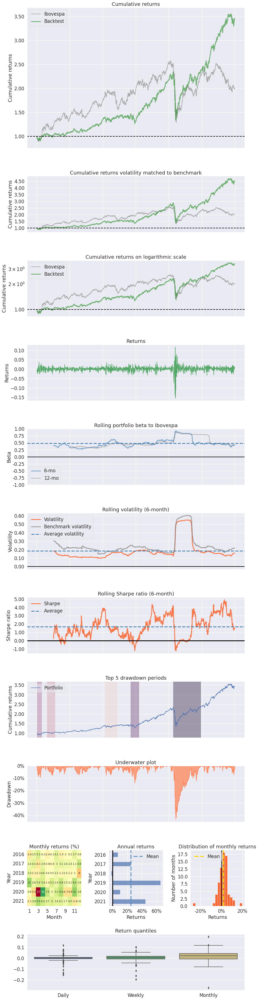

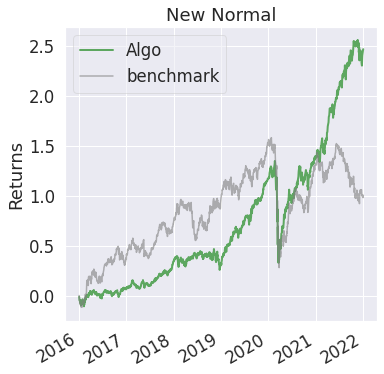

In [340]:
pf.create_full_tear_sheet(teste["Retornos HRP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.374%
Cumulative returns,230.244%
Annual volatility,20.219%
Sharpe ratio,1.10
Calmar ratio,0.61
Stability,0.93
Max drawdown,-36.897%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.90,2020-02-19,2020-03-18,2020-08-19,131
1,15.25,2018-11-07,2018-12-21,2019-02-04,64
2,8.85,2016-04-27,2016-06-14,2016-07-22,63
3,8.70,2018-01-26,2018-04-02,2018-07-25,129
4,8.57,2016-01-05,2016-02-11,2016-02-24,37


Stress Events,mean,min,max
New Normal,0.09%,-14.88%,9.95%


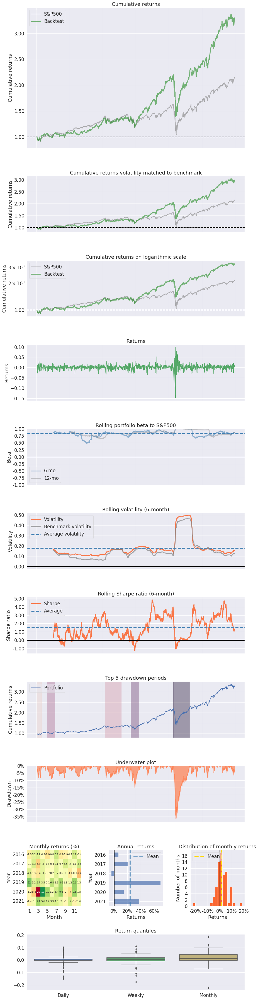

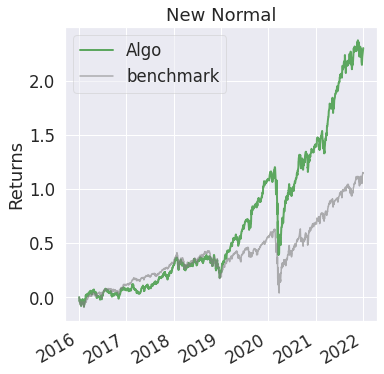

In [341]:
pf.create_full_tear_sheet(teste["Retornos MVP"], benchmark_rets=teste["S&P500"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,23.605%
Cumulative returns,250.392%
Annual volatility,21.583%
Sharpe ratio,1.09
Calmar ratio,0.54
Stability,0.94
Max drawdown,-43.809%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.81,2020-02-19,2020-03-18,2020-12-16,216
1,14.17,2018-11-07,2018-12-21,2019-02-04,64
2,10.18,2016-01-05,2016-02-11,2016-03-02,42
3,8.25,2018-01-26,2018-02-08,2018-06-04,92
4,7.37,2016-04-27,2016-06-27,2016-07-20,61


Stress Events,mean,min,max
New Normal,0.09%,-15.87%,11.31%


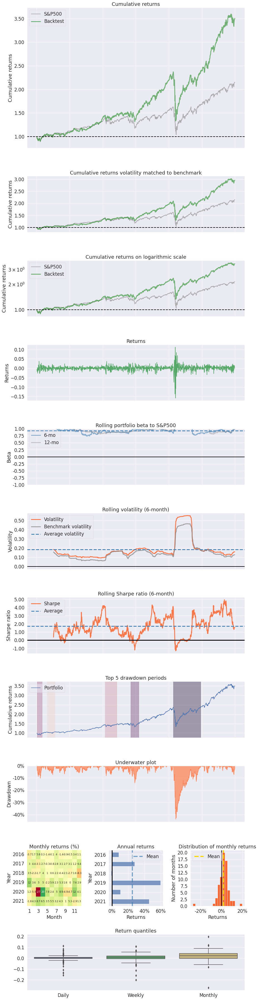

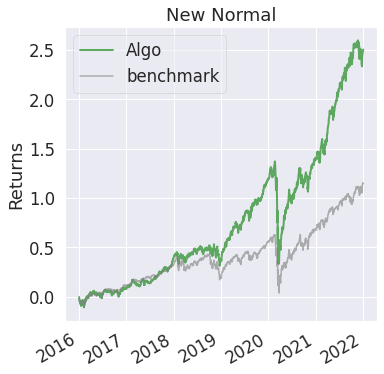

In [342]:
pf.create_full_tear_sheet(teste["Retornos IVP"], benchmark_rets=teste["S&P500"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,23.379%
Cumulative returns,246.606%
Annual volatility,21.509%
Sharpe ratio,1.09
Calmar ratio,0.54
Stability,0.94
Max drawdown,-43.292%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.29,2020-02-19,2020-03-18,2020-12-16,216
1,14.15,2018-11-07,2018-12-21,2019-02-04,64
2,9.55,2016-01-05,2016-02-11,2016-02-25,38
3,7.98,2016-04-27,2016-06-27,2016-07-22,63
4,7.76,2018-01-26,2018-02-08,2018-06-04,92


Stress Events,mean,min,max
New Normal,0.09%,-15.42%,11.72%


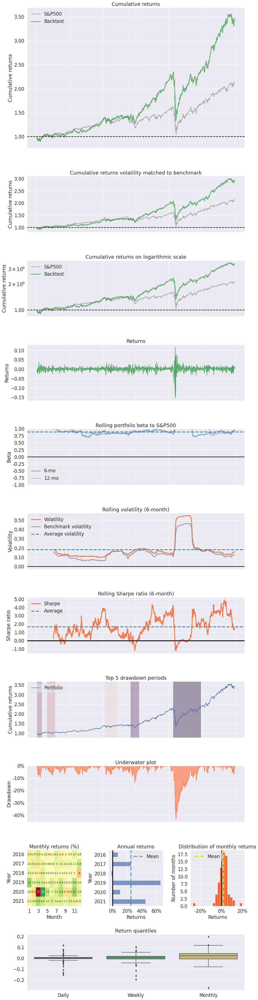

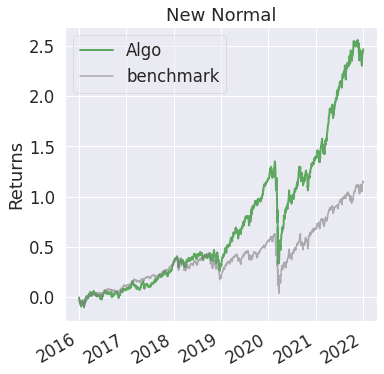

In [343]:
pf.create_full_tear_sheet(teste["Retornos HRP"], benchmark_rets=teste["S&P500"])

##Secundary tests (não precisa rodar)

In [344]:
portfolio_order = portfolios.T.iloc[:-2].reindex(columns=log_returns.columns)
portfolio_order

,PRIO3,EMBR3,BEEF3,HD,FANG,MRO,MRFG3,JBSS3,CPLE6,INTU,CRL,TGT,ADBE,ALPA4
MVP,0.001454,0.024711,0.10008,0.236398,0.005059,0.004804,0.004854,0.012213,0.068049,0.122342,0.06992,0.23956,0.035053,0.075504
IVP,0.018798,0.043629,0.060987,0.165237,0.030167,0.027117,0.049346,0.038183,0.06513,0.121907,0.10234,0.115052,0.103325,0.058781
HRP,0.019898,0.048117,0.066085,0.142819,0.022884,0.02057,0.071689,0.041375,0.07183,0.104911,0.088455,0.150227,0.08892,0.062221


In [345]:
ativos = np.array(log_returns.columns)
pesos_mvp = np.array(portfolio_order.loc['MVP'])
pesos_ivp = np.array(portfolio_order.loc['IVP'])
pesos_hrp = np.array(portfolio_order.loc['HRP'])

In [346]:
carteira_mvp = pd.DataFrame((log_returns * pesos_mvp).sum(axis=1)).rename(columns={0:'Retornos MVP'})
carteira_ivp = pd.DataFrame((log_returns * pesos_ivp).sum(axis=1)).rename(columns={0:'Retornos IVP'})
carteira_hrp = pd.DataFrame((log_returns * pesos_hrp).sum(axis=1)).rename(columns={0:'Retornos HRP'})

In [347]:
carteira_mvp_vol=np.sqrt(pesos_ivp.T.dot(covariancia).dot(pesos_ivp))
carteira_mvp_vol

0.013595716871365043

In [348]:
expected_return_annual_mvp = np.sum(carteira_mvp.mean()*252)
expected_return_annual_mvp

0.2227863805761259

In [349]:
individual_returns_anualized=log_returns.mean()*252
individual_returns_anualized=individual_returns_anualized.to_frame()
individual_returns_anualized.rename(columns={0:"Anual Returns %"}).sort_values(by = "Anual Returns %", ascending=False)

,Anual Returns %
PRIO3,0.760286
ALPA4,0.333738
INTU,0.333288
ADBE,0.308468
CRL,0.265244
CPLE6,0.257512
MRFG3,0.244704
JBSS3,0.226989
TGT,0.223102
HD,0.215887


In [350]:
individual_returns_anualized.iloc[-1,:]

0    0.333738
Name: ALPA4, dtype: float64

In [351]:
portfolios_methods = carteira_mvp.merge(carteira_ivp,left_index = True, right_index = True).merge(carteira_hrp,left_index = True, right_index = True)
portfolios_methods

,Retornos MVP,Retornos IVP,Retornos HRP
Date,,,
2016-01-05,0.000821,-0.005281,-0.006146
2016-01-06,-0.010466,-0.016554,-0.015681
2016-01-07,-0.016379,-0.015280,-0.015374
2016-01-08,-0.013490,-0.008298,-0.008024
2016-01-11,0.010473,0.003672,0.005498
...,...,...,...
2021-12-23,0.005968,0.006963,0.008230
2021-12-27,0.013083,0.013650,0.011947
2021-12-28,0.001728,-0.000376,0.000707


In [352]:
portfolios_methods_acum = (1+portfolios_methods).cumprod()
# portfolios_methods_acum.iloc[0] = 1
portfolios_methods_acum

,Retornos MVP,Retornos IVP,Retornos HRP
Date,,,
2016-01-05,1.000821,0.994719,0.993854
2016-01-06,0.990347,0.978252,0.978270
2016-01-07,0.974126,0.963305,0.963230
2016-01-08,0.960985,0.955311,0.955501
2016-01-11,0.971050,0.958820,0.960755
...,...,...,...
2021-12-23,3.219925,3.441226,3.404074
2021-12-27,3.262050,3.488198,3.444743
2021-12-28,3.267685,3.486887,3.447176


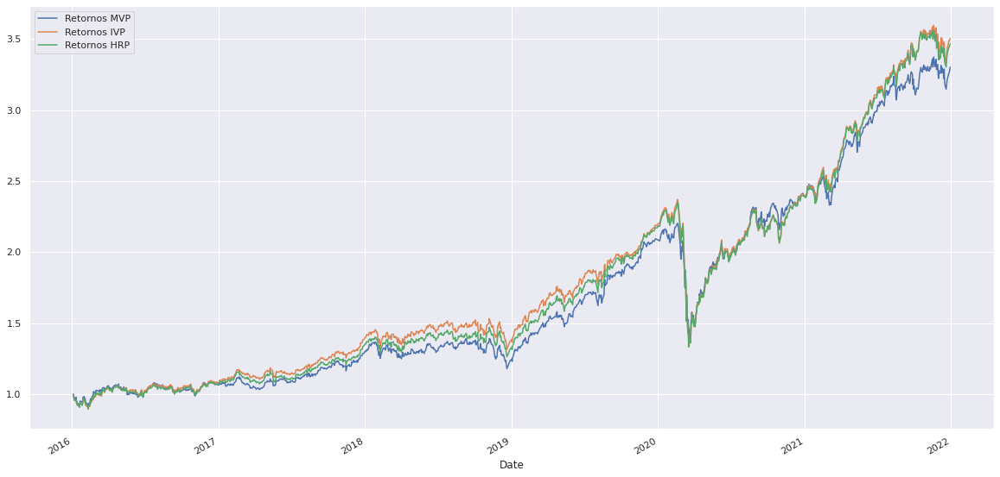

In [353]:
portfolios_methods_acum[['Retornos MVP','Retornos IVP','Retornos HRP']].plot(figsize = (20,10));

In [354]:
#Drawdown 30 dias 

portfolios_methods['MDD 30d MVP'] = portfolios_methods['Retornos MVP'].rolling(window=30).min()
portfolios_methods['MDD 30d IVP'] = portfolios_methods['Retornos IVP'].rolling(window=30).min()
portfolios_methods['MDD 30d HRP'] = portfolios_methods['Retornos HRP'].rolling(window=30).min()

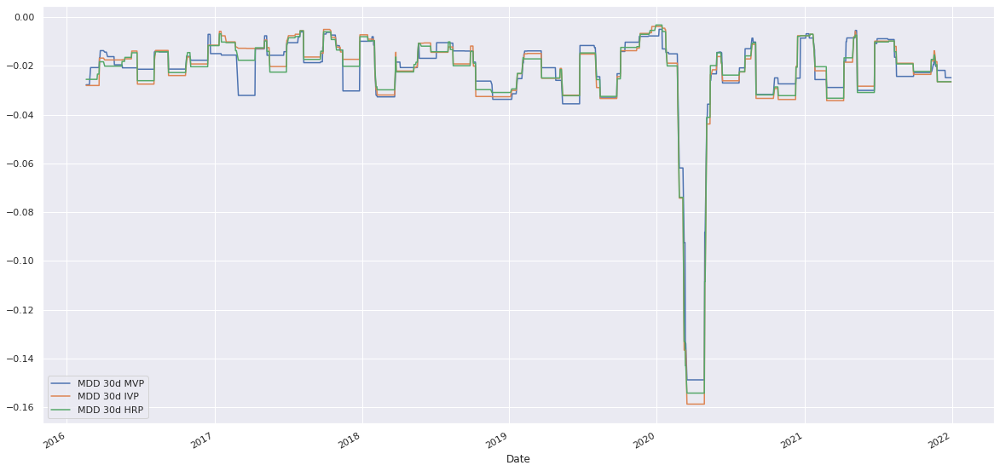

In [355]:
portfolios_methods[['MDD 30d MVP','MDD 30d IVP','MDD 30d HRP']].plot(figsize = (20,10));

In [356]:
bench

,Ibovespa,S&P500
Date,,
2016-01-05,0.006575,0.002010
2016-01-06,-0.015346,-0.013202
2016-01-07,-0.026145,-0.023986
2016-01-08,-0.002042,-0.010898
2016-01-11,-0.016435,0.000853
...,...,...
2021-12-23,-0.003360,0.006204
2021-12-27,0.006083,0.013744
2021-12-28,-0.006340,-0.001011


In [357]:
bench_acum

,Ibovespa,S&P500
Date,,
2016-01-05,1.006575,1.002010
2016-01-06,0.991128,0.988782
2016-01-07,0.965215,0.965065
2016-01-08,0.963245,0.954548
2016-01-11,0.947414,0.955362
...,...,...
2021-12-23,1.999633,2.122506
2021-12-27,2.011797,2.151678
2021-12-28,1.999041,2.149503


In [358]:
portfolios_methods_acum = portfolios_methods_acum.merge(bench_acum,left_index=True,right_index=True)
# portfolios_methods_acum.iloc[0] = 1
# portfolios_methods_acum = 10000 * portfolios_methods_acum
# portfolios_methods_acum['teste'] = portfolios_methods_acum["Retornos MVP"].pct_change()
# portfolios_methods_acum

In [359]:
portfolios_methods_acum

,Retornos MVP,Retornos IVP,Retornos HRP,Ibovespa,S&P500
Date,,,,,
2016-01-05,1.000821,0.994719,0.993854,1.006575,1.002010
2016-01-06,0.990347,0.978252,0.978270,0.991128,0.988782
2016-01-07,0.974126,0.963305,0.963230,0.965215,0.965065
2016-01-08,0.960985,0.955311,0.955501,0.963245,0.954548
2016-01-11,0.971050,0.958820,0.960755,0.947414,0.955362
...,...,...,...,...,...
2021-12-23,3.219925,3.441226,3.404074,1.999633,2.122506
2021-12-27,3.262050,3.488198,3.444743,2.011797,2.151678
2021-12-28,3.267685,3.486887,3.447176,1.999041,2.149503


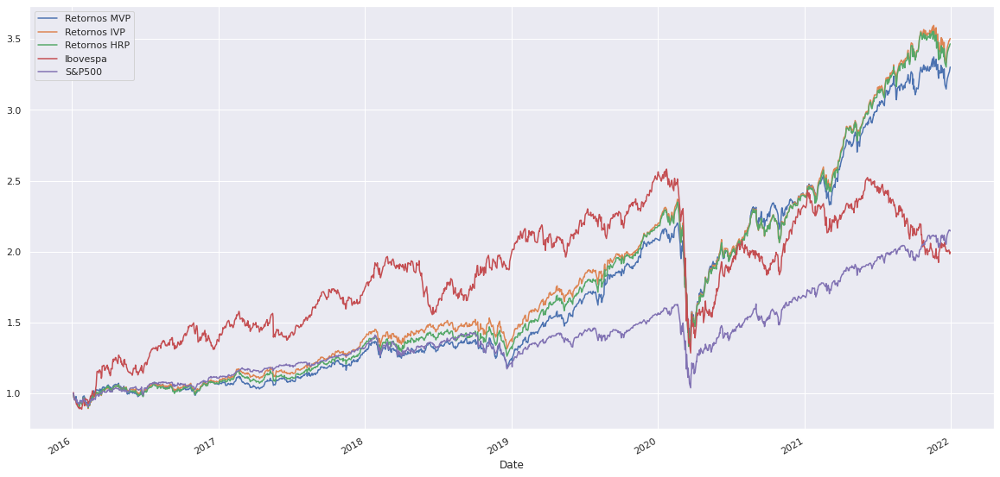

In [360]:
portfolios_methods_acum.plot(figsize = (20,10));

#Pre-selection 2: Function Obj

##Import Yahoo Finance

In [400]:
prices= pd.DataFrame()

ativos = ['BLK','FB','MKTX','ABMD','WAT','NEM','FLRY3.SA','ELET3.SA','ELET6.SA','VIIA3.SA','POSI3.SA','VRSK','PRIO3.SA','BPAN4.SA','NLOK','^BVSP','^GSPC']

inicio = '2016-01-01'
fim = '2021-12-31'

for ativo in ativos:
  prices[ativo] = yf.download(ativo, start = inicio, end = fim)['Adj Close']
  prices.columns = prices.columns.str.rstrip(".SA")

df = prices.iloc[:, :-2]

#Benchmarks
bench = prices.iloc[:,-2:]
bench = bench/bench.iloc[0]

bench = (bench.pct_change(axis=0)).apply(np.log1p)
bench = bench.iloc[1:,:].rename(columns={'^BVSP':'Ibovespa','^GSPC':'S&P500'})
bench_acum = (1+bench).cumprod()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [401]:
df

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
Date,,,,,,,,,,,,,,,
2016-01-04,283.160400,102.220001,104.399620,85.239998,130.350006,16.090446,5.758894,4.322257,6.972099,1.193003,1.404728,73.590370,0.230000,1.601875,8.671053
2016-01-05,283.891510,102.730003,105.173447,85.000000,129.809998,16.072996,5.826868,4.417776,7.035482,1.242712,1.448353,73.326508,0.224000,1.655569,8.687695
2016-01-06,280.661163,102.970001,103.902840,85.300003,129.710007,16.195154,5.796658,4.338176,7.141121,1.242712,1.483254,72.945358,0.223000,1.789804,8.675214
2016-01-07,268.394592,97.919998,102.278755,81.919998,128.820007,16.456930,5.804210,4.123259,6.972099,1.173120,1.491979,71.381668,0.225000,1.780855,8.529588
2016-01-08,261.636475,97.330002,101.008179,84.580002,126.720001,15.715237,5.826868,4.011818,6.746738,1.173120,1.430903,71.704193,0.215000,1.682416,8.525426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,901.420654,335.239990,408.796356,352.209991,361.709991,58.628990,16.660471,32.638519,31.421463,4.500000,8.836586,224.714218,19.700001,10.815247,25.624685
2021-12-27,909.952332,346.179993,411.722900,357.829987,367.609985,59.269157,16.852081,32.618889,31.604256,4.860000,9.311278,226.587433,20.660000,10.466367,25.882217
2021-12-28,909.212646,346.220001,412.290314,357.440002,367.529999,59.377491,17.014950,32.785763,31.623499,4.950000,9.612525,227.255005,20.049999,10.496270,25.931744


### Normalize Data

In [402]:
df = df/df.iloc[0]
df

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
Date,,,,,,,,,,,,,,,
2016-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2016-01-05,1.002582,1.004989,1.007412,0.997184,0.995857,0.998915,1.011803,1.022099,1.009091,1.041667,1.031056,0.996414,0.973913,1.033519,1.001919
2016-01-06,0.991174,1.007337,0.995242,1.000704,0.995090,1.006507,1.006558,1.003683,1.024243,1.041667,1.055901,0.991235,0.969565,1.117318,1.000480
2016-01-07,0.947854,0.957934,0.979685,0.961051,0.988262,1.022776,1.007869,0.953960,1.000000,0.983333,1.062112,0.969987,0.978261,1.111732,0.983685
2016-01-08,0.923987,0.952162,0.967515,0.992257,0.972152,0.976681,1.011803,0.928177,0.967677,0.983333,1.018634,0.974369,0.934783,1.050279,0.983205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,3.183428,3.279593,3.915688,4.131980,2.774913,3.643714,2.892998,7.551268,4.506743,3.771993,6.290602,3.053582,85.652176,6.751618,2.955199
2021-12-27,3.213558,3.386617,3.943720,4.197912,2.820176,3.683500,2.926270,7.546726,4.532961,4.073753,6.628526,3.079036,89.826085,6.533824,2.984899
2021-12-28,3.210946,3.387008,3.949155,4.193337,2.819563,3.690233,2.954552,7.585334,4.535721,4.149192,6.842978,3.088108,87.173908,6.552491,2.990611


### Log Returns

In [403]:
log_returns = (df.pct_change(axis=0)).apply(np.log1p)
log_returns= log_returns.iloc[1:,:]
log_returns

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
Date,,,,,,,,,,,,,,,
2016-01-05,0.002579,0.004977,0.007385,-0.002820,-0.004151,-0.001085,0.011734,0.021859,0.009050,0.040822,0.030583,-0.003592,-0.026433,0.032970,0.001917
2016-01-06,-0.011444,0.002333,-0.012155,0.003523,-0.000771,0.007571,-0.005198,-0.018182,0.014904,0.000000,0.023811,-0.005212,-0.004474,0.077962,-0.001438
2016-01-07,-0.044690,-0.050287,-0.015754,-0.040431,-0.006885,0.016035,0.001302,-0.050810,-0.023953,-0.057629,0.005865,-0.021670,0.008929,-0.005012,-0.016929
2016-01-08,-0.025502,-0.006044,-0.012500,0.031955,-0.016436,-0.046116,0.003896,-0.027399,-0.032857,0.000000,-0.041797,0.004508,-0.045462,-0.056863,-0.000488
2016-01-11,0.001753,0.001848,0.007444,0.004953,-0.005063,-0.057126,-0.005850,-0.007968,-0.038302,-0.070204,0.012121,0.009090,-0.042762,-0.043485,-0.006365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-23,0.002608,0.014391,0.004026,0.025332,0.001799,0.017454,-0.002871,-0.012849,-0.011568,0.000000,0.006218,0.007477,-0.008592,0.008330,0.010492
2021-12-27,0.009420,0.032112,0.007133,0.015830,0.016180,0.010860,0.011435,-0.000602,0.005801,0.076961,0.052326,0.008301,0.047581,-0.032790,0.010000
2021-12-28,-0.000813,0.000116,0.001377,-0.001090,-0.000218,0.001826,0.009618,0.005103,0.000609,0.018349,0.031841,0.002942,-0.029970,0.002853,0.001912


###Correlation Matrix

In [404]:
correlacao = log_returns.corr()
correlacao

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
BLK,1.000000,0.441625,0.374875,0.338993,0.503427,0.136274,0.266784,0.270954,0.262494,0.265319,0.193991,0.577787,0.266148,0.230236,0.283133
FB,0.441625,1.000000,0.299947,0.318568,0.336893,0.072490,0.243732,0.177294,0.193423,0.222952,0.155834,0.435220,0.145797,0.180928,0.268574
MKTX,0.374875,0.299947,1.000000,0.188782,0.288891,0.115117,0.145659,0.153031,0.145757,0.151184,0.093870,0.448909,0.114268,0.122378,0.180022
ABMD,0.338993,0.318568,0.188782,1.000000,0.326599,0.038834,0.110159,0.095563,0.086946,0.086145,0.058792,0.304853,0.109569,0.076702,0.174491
WAT,0.503427,0.336893,0.288891,0.326599,1.000000,0.062813,0.233310,0.187221,0.172709,0.165595,0.142895,0.446937,0.198633,0.200393,0.231034
NEM,0.136274,0.072490,0.115117,0.038834,0.062813,1.000000,0.084668,0.082203,0.084139,0.103089,0.079854,0.167054,0.110889,0.024518,0.071853
FLRY3,0.266784,0.243732,0.145659,0.110159,0.233310,0.084668,1.000000,0.360877,0.367320,0.378252,0.302179,0.253257,0.255912,0.271464,0.119865
ELET3,0.270954,0.177294,0.153031,0.095563,0.187221,0.082203,0.360877,1.000000,0.923712,0.355664,0.299182,0.211380,0.252456,0.308227,0.115602
ELET6,0.262494,0.193423,0.145757,0.086946,0.172709,0.084139,0.367320,0.923712,1.000000,0.363456,0.301197,0.215771,0.253464,0.331343,0.124666
VIIA3,0.265319,0.222952,0.151184,0.086145,0.165595,0.103089,0.378252,0.355664,0.363456,1.000000,0.346023,0.223193,0.280938,0.305488,0.117022


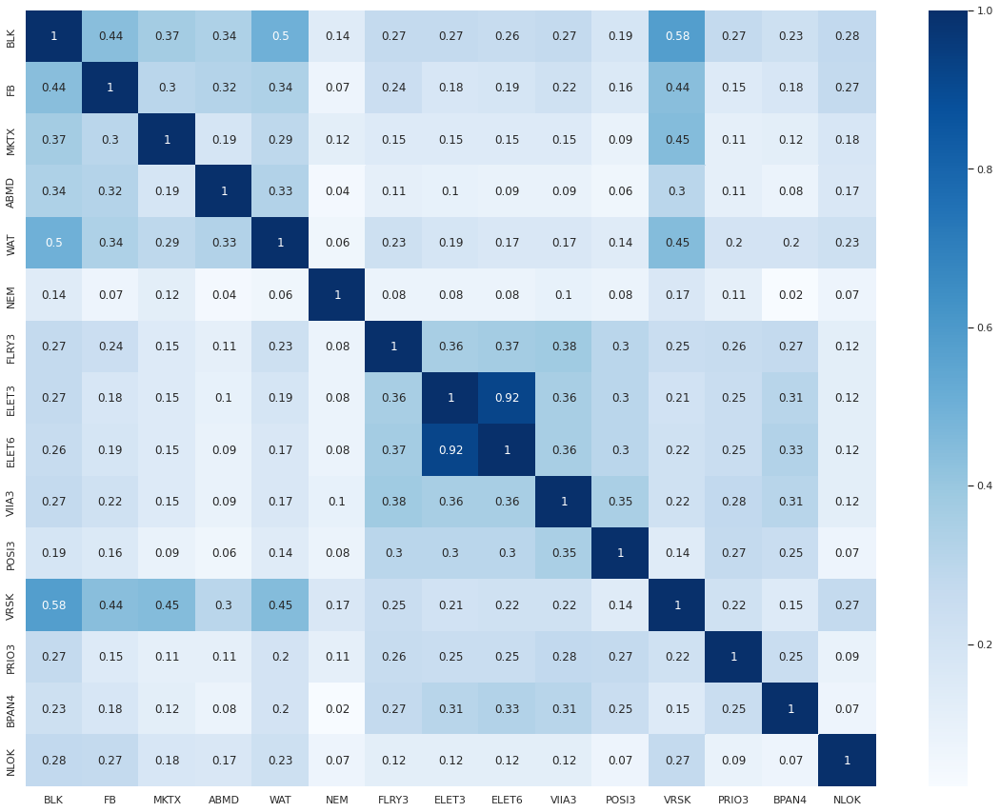

In [405]:
plt.figure(figsize = (20, 15))
sns.heatmap(round(correlacao,2), annot = True, cmap = "Blues")

<Figure size 1440x1080 with 0 Axes>

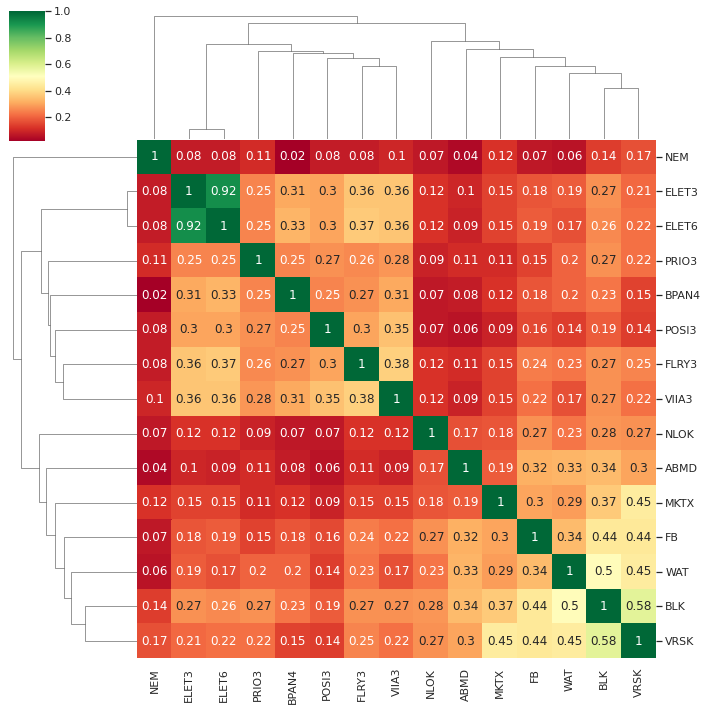

In [406]:
plt.figure(figsize = (20, 15))
sns.clustermap(round(correlacao,2), annot = True, cmap="RdYlGn")
plt.show()

### Tree Graphs

In [407]:
#convert matrix to list of edges and rename the columns
edges = correlacao.stack().reset_index()
edges.columns = ['Ticker_1','Ticker_2','correlation']

#remove self correlations
edges = edges.loc[edges['Ticker_1'] != edges['Ticker_2']].copy()
edges

,Ticker_1,Ticker_2,correlation
1,BLK,FB,0.441625
2,BLK,MKTX,0.374875
3,BLK,ABMD,0.338993
4,BLK,WAT,0.503427
5,BLK,NEM,0.136274
...,...,...,...
219,NLOK,VIIA3,0.117022
220,NLOK,POSI3,0.072772
221,NLOK,VRSK,0.274642
222,NLOK,PRIO3,0.091258


In [408]:
mean_correlation = edges['correlation'].mean()
mean_correlation

0.22243815164960945

In [409]:
#create undirected graph with weights corresponding to the correlation magnitude
G0 = nx.from_pandas_edgelist(edges, 'Ticker_1', 'Ticker_2', edge_attr=['correlation'])

#print out the graph info
#check number of nodes and degrees are as expected (all should have degree = 38, i.e. average degree = 38)
print(nx.info(G0))

Graph with 15 nodes and 105 edges


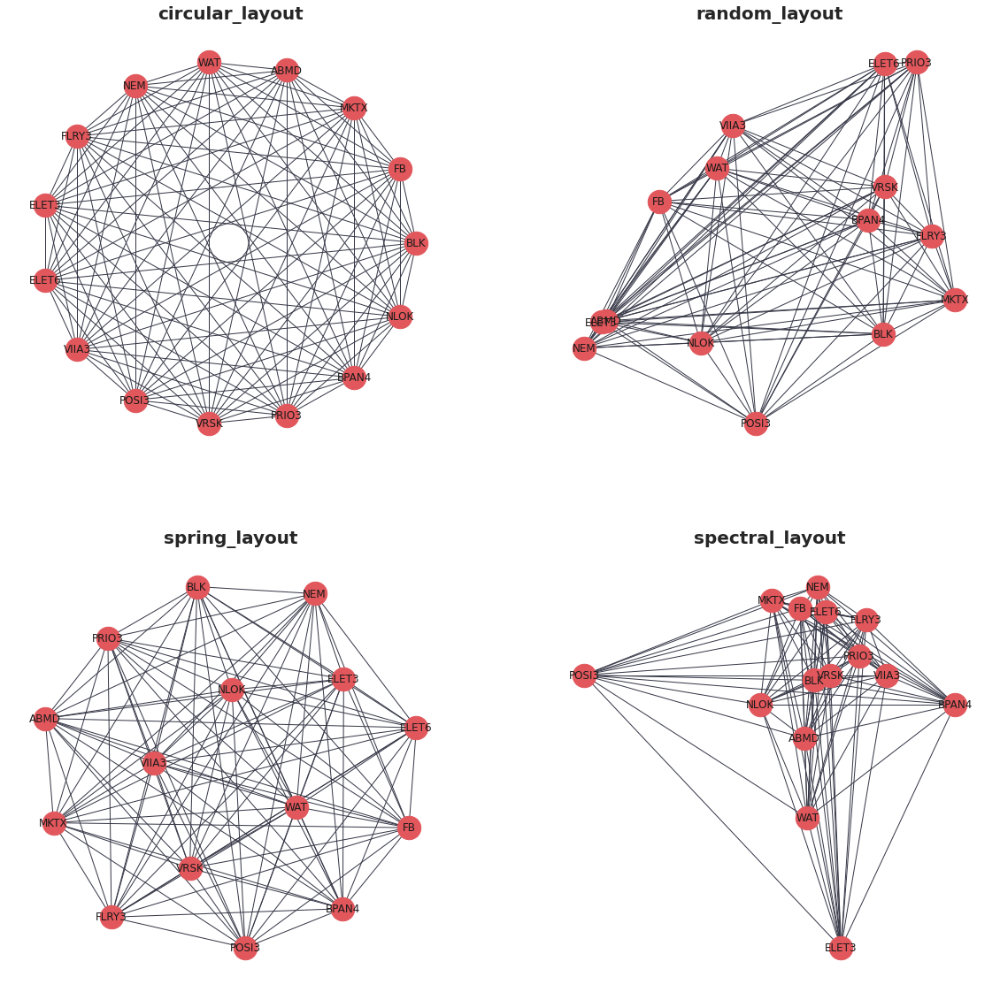

In [410]:
# create subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))

# save different layout functions in a list
layouts = [nx.circular_layout, nx.random_layout, nx.spring_layout, nx.spectral_layout]

# plot each different layout
for layout, ax in zip(layouts, axs.ravel()):
    nx.draw(
        G0,
        with_labels=True,
        node_size=700,
        node_color="#e1575c",
        edge_color="#363847",
        pos=layout(G0),
        ax=ax,
    )
    ax.set_title(layout.__name__, fontsize=20, fontweight="bold")

plt.show()


**Perguntas**
*   Quais ativos mostram as correlações mais fortes/significativas (ou seja, >0,5) entre si?
*   Essas correlações são positivas ou negativas?
*   Quais são os ativos mais/menos 'conectados'? (ou seja, quais ativos compartilham as correlações mais/menos fortes com outros ativos no conjunto de dados)
*   Quais grupos de ativos se comportam de maneira semelhante? (ou seja, quais ativos estão correlacionados com o mesmo tipo de outros ativos)

**Objetivo**
*   Reduzir o número de conexões entre nós filtrando conexões abaixo de um determinado valor limite para a força da correlação
*   Introduzir cor para significar correlações positivas ou negativas
*   Dimensionar a espessura da borda para indicar a magnitude da correlação
*   Dimensionar o tamanho dos nós para indicar quais ativos têm o maior número de correlações fortes com o restante dos ativos no conjunto de dados


In [411]:
# 'winner takes all' method - set minimum correlation threshold to remove some
# edges from the diagram
threshold = 0

# create a new graph from edge list
Gx = nx.from_pandas_edgelist(edges, "Ticker_1", "Ticker_2", edge_attr=["correlation"])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for Ticker_1, Ticker_2 in Gx.edges():
    corr = Gx[Ticker_1][Ticker_2]["correlation"]
    # add to remove node list if abs(corr) < threshold
    if abs(corr) < threshold:
        remove.append((Ticker_1, Ticker_2))

# remove edges contained in the remove list
Gx.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")

0 edges removed


In [412]:
def assign_colour(correlation):
    if correlation <= 0:
        return "#800000"  # red
    else:
        return "#006400"  # green


def assign_thickness(correlation, benchmark_thickness=2, scaling_factor=3):
    return benchmark_thickness * abs(correlation) ** scaling_factor


def assign_node_size(degree, scaling_factor=50):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for key, value in nx.get_edge_attributes(Gx, "correlation").items():
    edge_colours.append(assign_colour(value))
    edge_width.append(assign_thickness(value))

#assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(Gx.degree).items():
    node_size.append(assign_node_size(value))

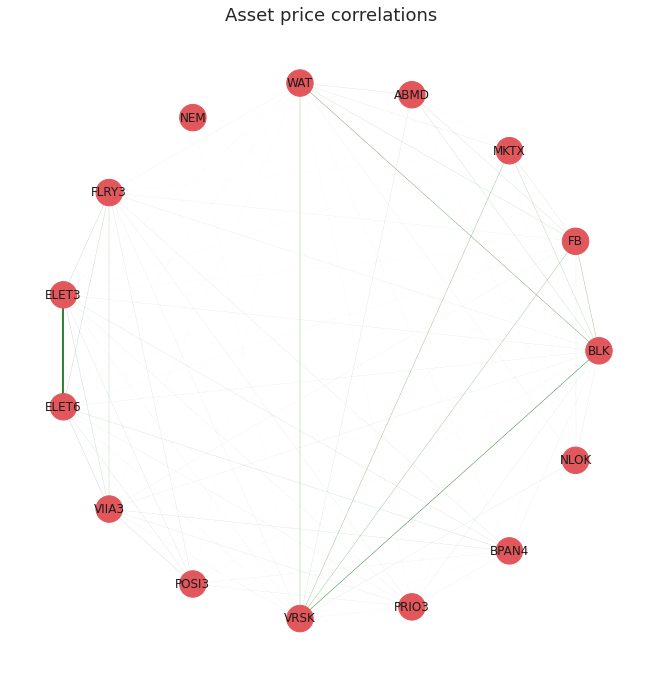

In [413]:
# draw improved graph
sns.set(rc={"figure.figsize": (9, 9)})
font_dict = {"fontsize": 18}

nx.draw(
    Gx,
    pos=nx.circular_layout(Gx),
    with_labels=True,
    node_size=node_size,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=edge_width,
)
plt.title("Asset price correlations", fontdict=font_dict)
plt.show()

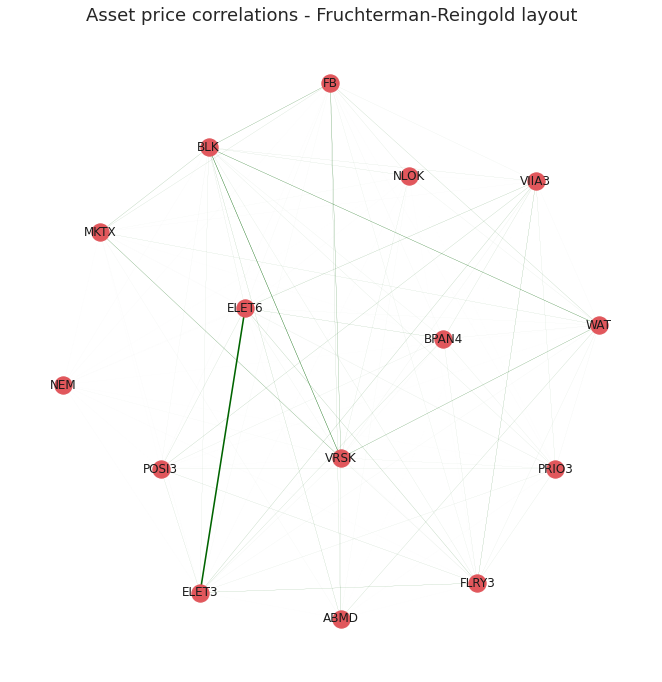

In [414]:
# draw improved graph
nx.draw(
    Gx,
    pos=nx.fruchterman_reingold_layout(Gx),
    with_labels=True,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=edge_width,
)
plt.title("Asset price correlations - Fruchterman-Reingold layout", fontdict=font_dict)
plt.show()

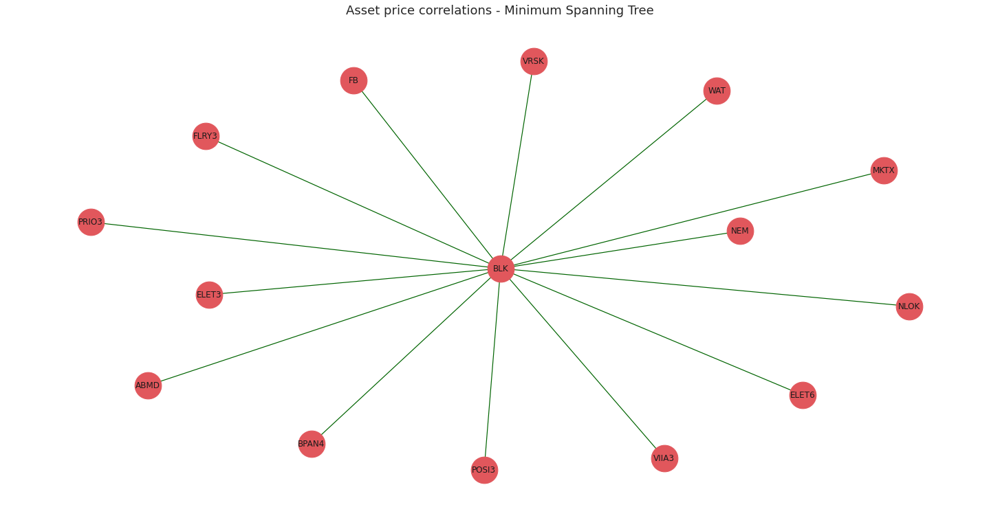

In [415]:
# create minimum spanning tree layout from Gx
# (after small correlations have been removed)

plt.figure(figsize = (20, 10))
mst = nx.minimum_spanning_tree(Gx)

edge_colours = []

# assign edge colours
for key, value in nx.get_edge_attributes(mst, "correlation").items():
    edge_colours.append(assign_colour(value))


# draw minimum spanning tree. Set node size and width to constant
nx.draw(
    mst,
    with_labels=True,
    pos=nx.fruchterman_reingold_layout(mst),
    node_size=1500,
    node_color="#e1575c",
    edge_color=edge_colours,
    width=1.2,
)

# set title
plt.title("Asset price correlations - Minimum Spanning Tree", fontdict=font_dict)
plt.show()

In [416]:
def convert_rankings_to_string(ranking):
    """
    Concatenate list of nodes and correlations into a single html
    string (required format for the plotly tooltip)

    Inserts html "<br>" inbetween each item in order to add a new
    line in the tooltip
    """
    s = ""
    for r in ranking:
        s += r + "<br>"
    return s


def calculate_stats(returns=log_returns):
    """calculate annualised returns and volatility for all ETFs

    Returns:
        tuple: Outputs the annualised volatility and returns as a list of
            floats (for use in assigning node colours and sizes) and also
            as a lists of formatted strings to be used in the tool tips.
    """

    # log returns are additive, 252 trading days
    annualized_returns = list(np.mean(returns) * 252 * 100)

    annualized_volatility = [
        np.std(returns[col] * 100) * (252 ** 0.5) for col in list(returns.columns)
    ]

    # create string for tooltip
    annualized_volatility_2dp = [
        "Annualized Volatility: " "%.1f" % r + "%" for r in annualized_volatility
    ]
    annualized_returns_2dp = [
        "Annualized Returns: " "%.1f" % r + "%" for r in annualized_returns
    ]

    return (
        annualized_volatility,
        annualized_returns,
        annualized_volatility_2dp,
        annualized_returns_2dp,
    )


def get_top_and_bottom_three(df=correlacao):
    """
    get a list of the top 3 and bottom 3 most/least correlated assests
    for each node.

    Args:
        df (pd.DataFrame): pandas correlation matrix

    Returns:
        top_3_list (list): list of lists containing the top 3 correlations
            (name and value)
        bottom_3_list (list): list of lists containing the bottom three
            correlations (name and value)
    """

    top_3_list = []
    bottom_3_list = []

    for col in df.columns:

        # exclude self correlation #reverse order of the list returned
        top_3 = list(np.argsort(abs(df[col]))[-4:-1][::-1])
        # bottom 3 list is returned in correct order
        bottom_3 = list(np.argsort(abs(df[col]))[:3])

        # get column index
        col_index = df.columns.get_loc(col)

        # find values based on index locations
        top_3_values = [df.index[x] + ": %.2f" % df.iloc[x, col_index] for x in top_3]
        bottom_3_values = [
            df.index[x] + ": %.2f" % df.iloc[x, col_index] for x in bottom_3
        ]

        top_3_list.append(convert_rankings_to_string(top_3_values))
        bottom_3_list.append(convert_rankings_to_string(bottom_3_values))

    return top_3_list, bottom_3_list

In [417]:
def get_coordinates(G=mst):
    """Returns the positions of nodes and edges in a format
    for Plotly to draw the network
    """
    # get list of node positions
    pos = nx.fruchterman_reingold_layout(mst)

    Xnodes = [pos[n][0] for n in mst.nodes()]
    Ynodes = [pos[n][1] for n in mst.nodes()]

    Xedges = []
    Yedges = []
    for e in mst.edges():
        # x coordinates of the nodes defining the edge e
        Xedges.extend([pos[e[0]][0], pos[e[1]][0], None])
        Yedges.extend([pos[e[0]][1], pos[e[1]][1], None])

    return Xnodes, Ynodes, Xedges, Yedges

In [418]:
# get statistics for tooltip

# make list of node labels.
node_label = list(mst.nodes())
# calculate annualised returns, annualised volatility and round to 2dp
annual_vol, annual_ret, annual_vol_2dp, annual_ret_2dp = calculate_stats()
# get top and bottom 3 correlations for each node
top_3_corrs, bottom_3_corrs = get_top_and_bottom_three()


# create tooltip string by concatenating statistics
description = [
    f"<b>{node}</b>"
    + "<br>"
    + annual_ret_2dp[index]
    + "<br>"
    + annual_vol_2dp[index]
    + "<br><br>Strongest correlations with: "
    + "<br>"
    + top_3_corrs[index]
    + "<br>Weakest correlations with: "
    "<br>" + bottom_3_corrs[index]
    for index, node in enumerate(node_label)
]

# get coordinates for nodes and edges
Xnodes, Ynodes, Xedges, Yedges = get_coordinates()

# assign node colour depending on positive or negative annualised returns
node_colour = [assign_colour(i) for i in annual_ret]

# assign node size based on annualised returns size (scaled by a factor)
node_size = [abs(x) ** 0.5 * 5 for x in annual_ret]

In [419]:
# Plot graph

# edges
tracer = go.Scatter(
    x=Xedges,
    y=Yedges,
    mode="lines",
    line=dict(color="#DCDCDC", width=1),
    hoverinfo="none",
    showlegend=False,
)


# nodes
tracer_marker = go.Scatter(
    x=Xnodes,
    y=Ynodes,
    mode="markers+text",
    textposition="top center",
    marker=dict(size=node_size, line=dict(width=1), color=node_colour),
    hoverinfo="text",
    hovertext=description,
    text=node_label,
    textfont=dict(size=15),
    showlegend=False,
)


axis_style = dict(
    title="",
    titlefont=dict(size=20),
    showgrid=False,
    zeroline=False,
    showline=False,
    ticks="",
    showticklabels=False,
)


layout = dict(
    title="Minimum Spanning Tree",
    width=1200,
    height=700,
    autosize=False,
    showlegend=False,
    xaxis=axis_style,
    yaxis=axis_style,
    hovermode="closest",
    plot_bgcolor="#fff",
)


fig = go.Figure()
fig.add_trace(tracer)
fig.add_trace(tracer_marker)
fig.update_layout(layout)

fig.show()

display(
    HTML(
        """
        <p>Node sizes are proportional to the size of
        annualised returns.<br>Node colours signify positive
        or negative returns since beginning of the timeframe.</p>
        """
    )
)

##### Grau de Centralidade

In [420]:
deg_centrality = nx.degree_centrality(Gx)
deg_centrality = pd.DataFrame(deg_centrality.items(), columns=['Ticker', 'Grau de Centralidade']).sort_values(by='Grau de Centralidade', ascending = False)
deg_centrality

,Ticker,Grau de Centralidade
0,BLK,1.0
1,FB,1.0
2,MKTX,1.0
3,ABMD,1.0
4,WAT,1.0
5,NEM,1.0
6,FLRY3,1.0
7,ELET3,1.0
8,ELET6,1.0
9,VIIA3,1.0


In [421]:
pr = nx.pagerank(Gx, alpha = 0.8)
pr

{'ABMD': 0.06666666666666665,
 'BLK': 0.06666666666666665,
 'BPAN4': 0.06666666666666665,
 'ELET3': 0.06666666666666665,
 'ELET6': 0.06666666666666665,
 'FB': 0.06666666666666665,
 'FLRY3': 0.06666666666666665,
 'MKTX': 0.06666666666666665,
 'NEM': 0.06666666666666665,
 'NLOK': 0.06666666666666665,
 'POSI3': 0.06666666666666665,
 'PRIO3': 0.06666666666666665,
 'VIIA3': 0.06666666666666665,
 'VRSK': 0.06666666666666665,
 'WAT': 0.06666666666666665}

###Test Graph Community
Disponível em: (https://devmessias.github.io/post/nsbm_sp500_stock_market_disparity_filter/)

####Cruzamento

In [422]:
df_cluster = pd.read_excel('/content/drive/MyDrive/IC ITA/Projeto de Pesquisa - IC ITA/Resultados/Ativos melhor cluster.xlsx',sheet_name=1).set_index('Código')
df_cluster

,Setor NAICS,Sharpe Ratio,Indice,Quarter
Código,,,,
BLK,Serviços financeiros e seguros,0.030077,S&P500,3T2021
FB,"Serviços profissionais, científicos e técnicos",0.030099,S&P500,3T2021
MKTX,Serviços financeiros e seguros,0.030021,S&P500,3T2021
ABMD,Indústria manufatureira,0.030181,S&P500,3T2021
WAT,Indústria manufatureira,0.030145,S&P500,3T2021
NEM,"Mineração, exploração de pedreiras e extração ...",0.029966,S&P500,3T2021
FLRY3,Assistência médica e social,0.016241,Ibov,3T2021
ELET3,"Empresa de eletricidade, gás e água",0.022358,Ibov,3T2021
ELET6,"Empresa de eletricidade, gás e água",0.021394,Ibov,3T2021


In [423]:
all_symbols = df_cluster.index.values
all_sectors = df_cluster['Setor NAICS'].values

symbol2sector = dict(zip(all_symbols, all_sectors))

In [424]:
symbol2sector

{'ABMD': 'Indústria manufatureira',
 'BLK': 'Serviços financeiros e seguros',
 'BPAN4': 'Serviços financeiros e seguros',
 'ELET3': 'Empresa de eletricidade, gás e água',
 'ELET6': 'Empresa de eletricidade, gás e água',
 'FB': 'Serviços profissionais, científicos e técnicos',
 'FLRY3': 'Assistência médica e social',
 'MKTX': 'Serviços financeiros e seguros',
 'NEM': 'Mineração, exploração de pedreiras e extração ...',
 'NLOK': 'Informação',
 'POSI3': 'Indústria manufatureira',
 'PRIO3': 'Mineração, exploração de pedreiras e extração ...',
 'VIIA3': 'Comércio varejista',
 'VRSK': 'Informação',
 'WAT': 'Indústria manufatureira'}

####Build Graph

In [506]:
pos_correlation = correlacao.copy()
# vamos considerar apenas as correlações positivas pois queremos 
# apenas as comunidades
pos_correlation[pos_correlation < 0] = 0
# diagonal principal é setada a 0 para evitar auto-arestas
np.fill_diagonal(pos_correlation.values, 0)

In [523]:
g = ig.Graph.Weighted_Adjacency(pos_correlation.values, mode='undirected')
# criamos uma feature symbol para cada vértice
g.vs["symbol"] = log_returns.columns
# o grafo pode estar desconectado. Portanto, extraímos a componente gigante
cl = g.clusters()
g = cl.giant()
n_edges_before = g.ecount()

In [524]:
_ = filter_ig_graph(g,0.9 ,cond="both", field="weight") #no filter disparidade
cl = g.clusters()
g = cl.giant()
n_edges_after = g.ecount()

In [525]:
g.vs["symbol"]

['BLK',
 'FB',
 'MKTX',
 'ABMD',
 'WAT',
 'NEM',
 'FLRY3',
 'ELET3',
 'ELET6',
 'VIIA3',
 'POSI3',
 'VRSK',
 'PRIO3',
 'BPAN4',
 'NLOK']

In [526]:
print(f"Percentage of edges removed: {(n_edges_before - n_edges_after)/n_edges_before*100:.2f}%")
print(f"Number of remained stocks: {len(symbols)}")

Percentage of edges removed: 0.00%
Number of remained stocks: 15


In [527]:
import graph_tool.all as gt

gnsbm = gt.Graph(directed=False)

# iremos adicionar os vértices
for v in g.vs:
  gnsbm.add_vertex()
# e as arestas
for e in g.es:
  gnsbm.add_edge(e.source, e.target)

In [528]:
state = gt.minimize_nested_blockmodel_dl(gnsbm)

In [529]:
symbols = g.vs["symbol"]
sectors = [symbol2sector[symbol] for symbol in symbols]
u_sectors = np.sort(np.unique(sectors))
u_colors = [plt.cm.tab10(i/len(u_sectors)) for i in range(len(u_sectors))]

# a primeira cor da lista era muito similar a segunda,
u_colors[0] = [0, 1, 0, 1]
sector2color = {sector: color for sector, color in zip(u_sectors, u_colors)}

rgba = gnsbm.new_vertex_property("vector<double>")
gnsbm.vertex_properties['rgba'] = rgba

for i, symbol in enumerate(symbols):
  c = sector2color[symbol2sector[symbol]]
  rgba[i] = [c[0], c[1], c[2], .5]

In [533]:
options = {
    'output': f'nsbm_{inicio}_{fim}.png',
    'beta': 0.8,
    'bg_color': 'w',
    # 'output_size': (1500, 1500),
    'vertex_color': gnsbm.vertex_properties['rgba'],
    'vertex_fill_color': gnsbm.vertex_properties['rgba'],
    'hedge_pen_width': 2,
    'hvertex_fill_color': np.array([0., 0., 0., .5]),
    'hedge_color': np.array([0., 0., 0., .5]),
    'hedge_marker_size': 20, 
    'hvertex_size':20   
}

state.draw(**options)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8b81861f50, at 0x7f8b78ee77d0>,
 <GraphView object, directed, with 16 vertices and 15 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7f8b790f9a90, at 0x7f8b783fe050>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7f8b790f9a90, at 0x7f8ba01604d0>, False), at 0x7f8b790f9a90>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f8b790f9a90, at 0x7f8ba0160a90>)

In [531]:
list(sector2color.keys())

['Assistência médica e social',
 'Comércio varejista',
 'Empresa de eletricidade, gás e água',
 'Indústria manufatureira',
 'Informação',
 'Mineração, exploração de pedreiras e extração ...',
 'Serviços financeiros e seguros',
 'Serviços profissionais, científicos e técnicos']

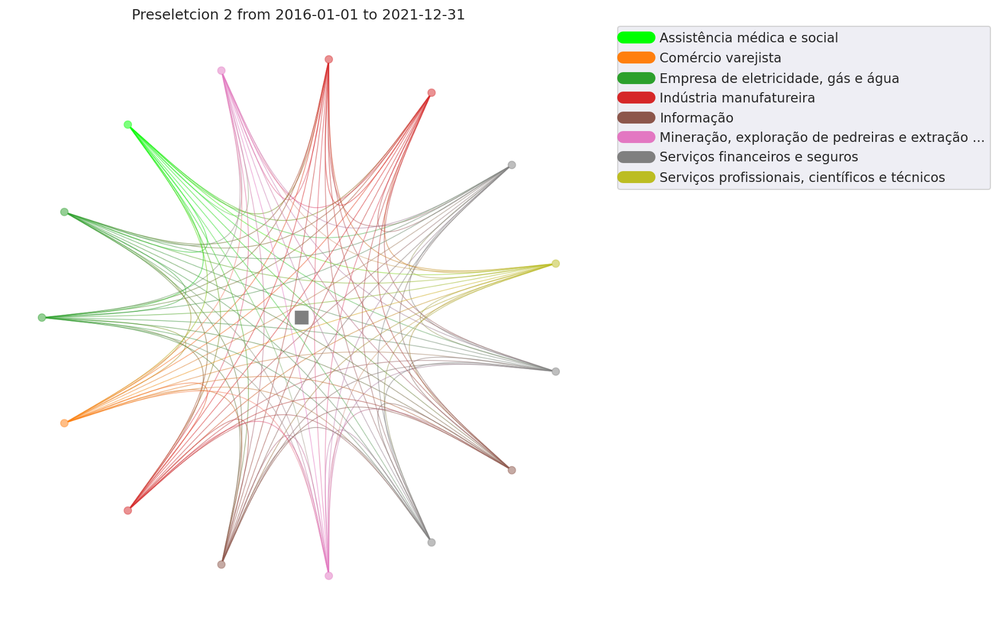

In [534]:
plt.figure(dpi=150)
plt.title(f"Preseletcion 2 from {inicio} to {fim}")
legend = plt.legend([plt.Line2D([0], [0], color=c, lw=10) for c in list(sector2color.values())],list(sector2color.keys()),bbox_to_anchor=(1.05, 1),loc=2,borderaxespad=0.)

plt.imshow(plt.imread(f'nsbm_{inicio}_{fim}.png'))
plt.xticks([])
plt.yticks([])
plt.axis('off')

plt.savefig(f'nsbm_final_{inicio}_{fim}.png', bbox_inches='tight',dpi=150, bbox_extra_artists=(legend,), facecolor='w', edgecolor='w')
plt.show()

In [535]:
state.print_summary()

l: 0, N: 15, B: 1
l: 1, N: 1, B: 1


In [536]:
symbol = "BLK"
index_stock = symbols.index(symbol)
symbol, symbol2sector[symbol]

('BLK', 'Serviços financeiros e seguros')

In [537]:
# para obter os indices 
r0 = state.levels[0].get_blocks()[index_stock]
r1 = state.levels[1].get_blocks()[r0]
r2 = state.levels[2].get_blocks()[r1]
r3 = state.levels[3].get_blocks()[r2]
(r1, r2, r3)

(0, 0, 0)

#### MST

In [436]:
dist_matrix = np.sqrt(2*(1-correlacao))
dist_matrix = dist_matrix.fillna(0)
np.fill_diagonal(dist_matrix.values, 0)

In [437]:
g = ig.Graph.Weighted_Adjacency(dist_matrix.values, mode='undirected')
g = g.spanning_tree(weights="weight", return_tree=True)
g.vs["symbol"] = log_returns.columns

sectors = [symbol2sector[symbol] for symbol in df_cluster.index]
colors = [
    sector2color[sector] for sector in sectors
]

In [438]:
sectors = [symbol2sector[symbol] for symbol in log_returns.columns]
colors = [
    sector2color[sector] for sector in sectors
]

In [439]:
g.vs["color"] = colors

pos = g.layout_fruchterman_reingold(niter=10000, weights="weight")
pos = np.array(pos.coords)

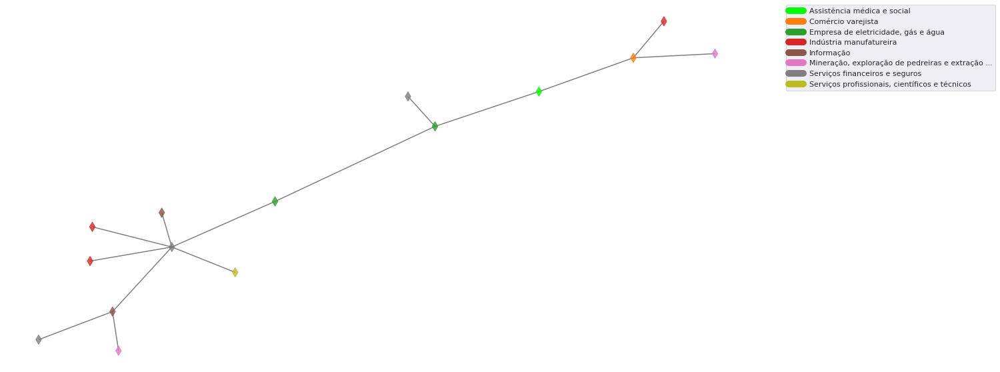

In [440]:
from matplotlib.collections import LineCollection

lines = []
colors = []
for s, t in g.get_edgelist():
    x0, y0 = pos[s]
    x1, y1 = pos[t]
    lines.append([(x0, y0), (x1, y1)])
    colors.append("black")
lc = LineCollection(lines, colors=colors, zorder=0, alpha=.5)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1, 1, 1)
ax.scatter(
    pos[:, 0],
    pos[:, 1],
    c=g.vs["color"],
    s=100,
    marker="d",
    alpha=.8,
    zorder=1
)
ax.add_collection(lc)
ax.axis('off')
legend = ax.legend(
    [plt.Line2D([0], [0], color=c, lw=10)
        for c in list(sector2color.values())],
    list(sector2color.keys()),
    bbox_to_anchor=(1.05, 1),
    loc=2,
    borderaxespad=0.)
plt.savefig(f'mst_{inicio}_{fim}.png', bbox_inches='tight',)
plt.show()

### Covariance Matrix

In [441]:
covariancia = log_returns.cov()
covariancia

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
BLK,0.000314,0.000161,0.000131,0.000157,0.000151,0.000052,0.000099,0.000177,0.000149,0.000199,0.000142,0.000148,0.000220,0.000157,0.000110
FB,0.000161,0.000420,0.000121,0.000170,0.000117,0.000032,0.000104,0.000134,0.000127,0.000194,0.000131,0.000129,0.000139,0.000143,0.000120
MKTX,0.000131,0.000121,0.000389,0.000097,0.000096,0.000049,0.000060,0.000111,0.000092,0.000126,0.000076,0.000128,0.000105,0.000093,0.000078
ABMD,0.000157,0.000170,0.000097,0.000681,0.000144,0.000022,0.000060,0.000092,0.000073,0.000095,0.000063,0.000115,0.000133,0.000077,0.000100
WAT,0.000151,0.000117,0.000096,0.000144,0.000285,0.000023,0.000082,0.000116,0.000093,0.000118,0.000099,0.000109,0.000156,0.000130,0.000085
NEM,0.000052,0.000032,0.000049,0.000022,0.000023,0.000470,0.000038,0.000066,0.000058,0.000095,0.000071,0.000052,0.000112,0.000020,0.000034
FLRY3,0.000099,0.000104,0.000060,0.000060,0.000082,0.000038,0.000436,0.000278,0.000245,0.000335,0.000260,0.000076,0.000249,0.000218,0.000055
ELET3,0.000177,0.000134,0.000111,0.000092,0.000116,0.000066,0.000278,0.001356,0.001087,0.000555,0.000453,0.000113,0.000433,0.000436,0.000093
ELET6,0.000149,0.000127,0.000092,0.000073,0.000093,0.000058,0.000245,0.001087,0.001021,0.000492,0.000396,0.000100,0.000377,0.000407,0.000087
VIIA3,0.000199,0.000194,0.000126,0.000095,0.000118,0.000095,0.000335,0.000555,0.000492,0.001798,0.000604,0.000137,0.000555,0.000498,0.000108


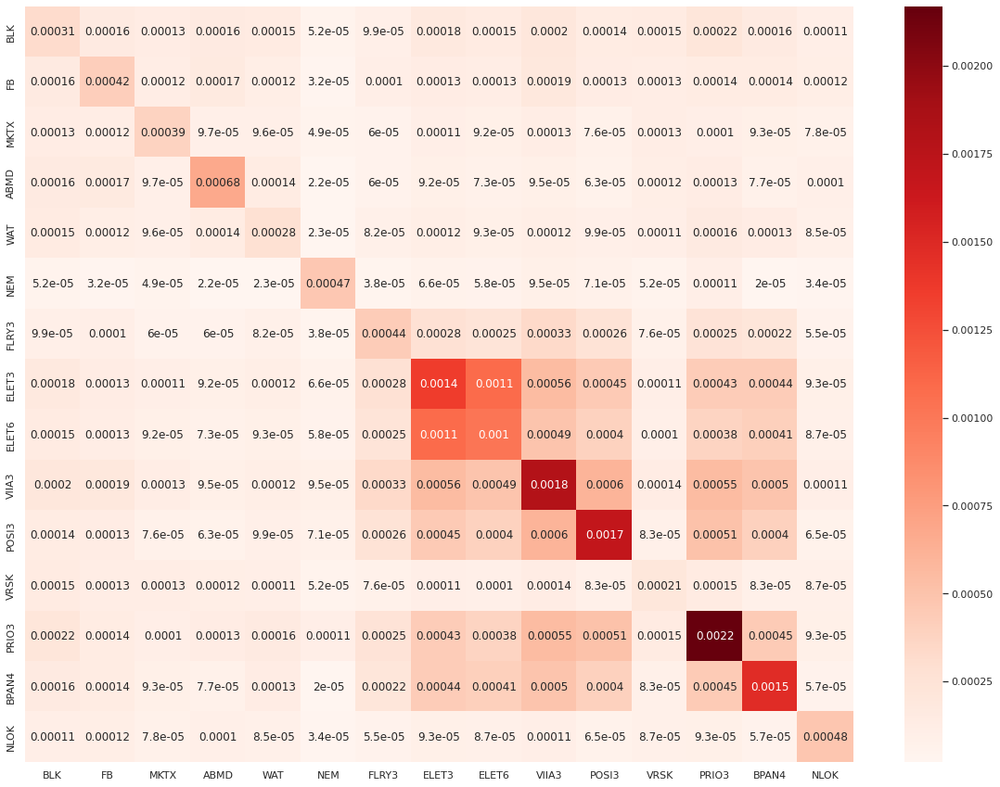

In [442]:
plt.figure(figsize = (20, 15))
sns.heatmap(covariancia, annot = True, cmap = 'Reds')

### Tree Clustering

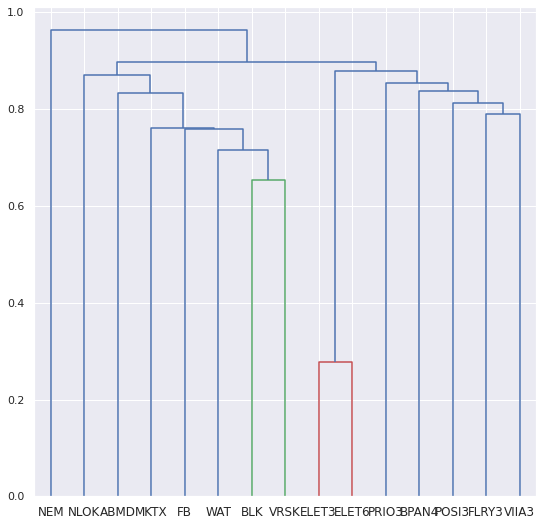

ABMD     0.070194
BLK      0.084586
BPAN4    0.022608
ELET3    0.026519
ELET6    0.032594
FB       0.073152
FLRY3    0.073739
MKTX     0.079125
NEM      0.119248
NLOK     0.100017
POSI3    0.019696
PRIO3    0.015339
VIIA3    0.017888
VRSK     0.171909
WAT      0.093387
dtype: float64

In [443]:
tree = getHRP(covariancia, correlacao)
tree

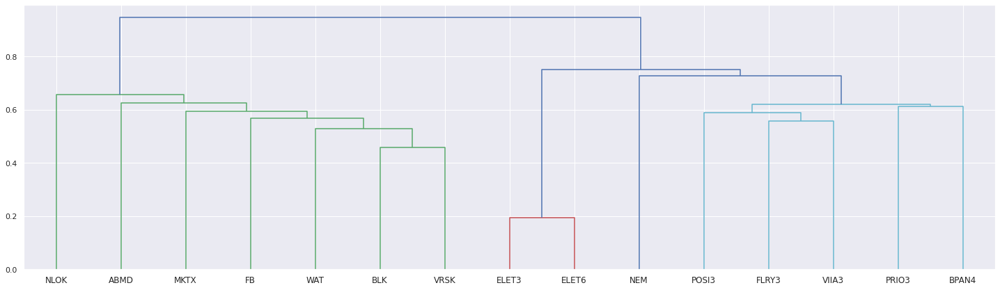

In [444]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

plt.figure(figsize=(25,7))
distances = np.sqrt((1 - correlacao) / 2)
clusters = linkage(squareform(distances), method="ward")

dendrogram(clusters, labels=df.columns);

## Portfolios Optimazed

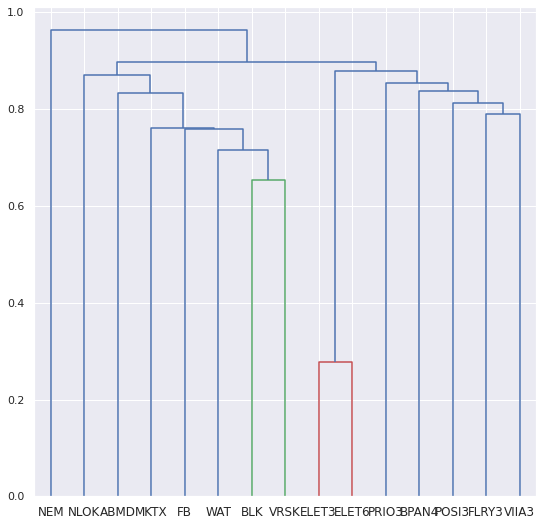

     pcost       dcost       gap    pres   dres
 0: -9.9999e-01 -2.0000e+00  1e+00  2e-15  1e+00
 1: -9.9999e-01 -1.0100e+00  1e-02  2e-16  1e-02
 2: -9.9999e-01 -1.0001e+00  1e-04  2e-16  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  1e-16  1e-05
 4: -9.9999e-01 -1.0000e+00  3e-06  2e-16  6e-17
 5: -9.9999e-01 -9.9999e-01  5e-07  2e-16  5e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9999e-01 -2.0000e+00  1e+00  2e-15  1e+00
 1: -9.9999e-01 -1.0100e+00  1e-02  7e-17  1e-02
 2: -9.9999e-01 -1.0001e+00  1e-04  1e-16  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  2e-16  1e-05
 4: -9.9999e-01 -1.0000e+00  3e-06  2e-16  6e-17
 5: -9.9999e-01 -9.9999e-01  5e-07  7e-17  6e-17
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.9999e-01 -2.0000e+00  1e+00  4e-15  1e+00
 1: -9.9999e-01 -1.0100e+00  1e-02  2e-16  1e-02
 2: -9.9999e-01 -1.0001e+00  1e-04  4e-17  1e-04
 3: -9.9999e-01 -1.0000e+00  1e-05  1e-16  1e-05
 4: -9.9999e-01 -1.0000e

,MVP,IVP,HRP
VRSK,0.213455,0.168285,0.171909
NEM,0.179156,0.074923,0.119248
NLOK,0.109500,0.073636,0.100017
WAT,0.157547,0.123591,0.093387
BLK,0.011887,0.111943,0.084586
MKTX,0.093592,0.090564,0.079125
FLRY3,0.119283,0.080734,0.073739
FB,0.034797,0.083728,0.073152
ABMD,0.041146,0.051679,0.070194
ELET6,0.009468,0.034491,0.032594


In [445]:
portfolios = get_all_portfolios(log_returns)
portfolios

###Join Dataframes - Sectors

In [446]:
df_cluster = pd.read_excel('/content/drive/MyDrive/IC ITA/Projeto de Pesquisa - IC ITA/Resultados/Ativos melhor cluster.xlsx',sheet_name=1).set_index('Código')
df_cluster

,Setor NAICS,Sharpe Ratio,Indice,Quarter
Código,,,,
BLK,Serviços financeiros e seguros,0.030077,S&P500,3T2021
FB,"Serviços profissionais, científicos e técnicos",0.030099,S&P500,3T2021
MKTX,Serviços financeiros e seguros,0.030021,S&P500,3T2021
ABMD,Indústria manufatureira,0.030181,S&P500,3T2021
WAT,Indústria manufatureira,0.030145,S&P500,3T2021
NEM,"Mineração, exploração de pedreiras e extração ...",0.029966,S&P500,3T2021
FLRY3,Assistência médica e social,0.016241,Ibov,3T2021
ELET3,"Empresa de eletricidade, gás e água",0.022358,Ibov,3T2021
ELET6,"Empresa de eletricidade, gás e água",0.021394,Ibov,3T2021


In [447]:
portfolios = portfolios.merge(df_cluster, left_index = True, right_index = True)
portfolios = portfolios[['MVP','IVP','HRP','Setor NAICS','Indice']]
portfolios

,MVP,IVP,HRP,Setor NAICS,Indice
VRSK,0.213455,0.168285,0.171909,Informação,S&P500
NEM,0.179156,0.074923,0.119248,"Mineração, exploração de pedreiras e extração ...",S&P500
NLOK,0.109500,0.073636,0.100017,Informação,S&P500
WAT,0.157547,0.123591,0.093387,Indústria manufatureira,S&P500
BLK,0.011887,0.111943,0.084586,Serviços financeiros e seguros,S&P500
MKTX,0.093592,0.090564,0.079125,Serviços financeiros e seguros,S&P500
FLRY3,0.119283,0.080734,0.073739,Assistência médica e social,Ibov
FB,0.034797,0.083728,0.073152,"Serviços profissionais, científicos e técnicos",S&P500
ABMD,0.041146,0.051679,0.070194,Indústria manufatureira,S&P500
ELET6,0.009468,0.034491,0.032594,"Empresa de eletricidade, gás e água",Ibov


#### EDA

In [448]:
sum_sector = pd.DataFrame(portfolios.groupby(portfolios['Setor NAICS']).sum())
sum_sector

,MVP,IVP,HRP
Setor NAICS,,,
Assistência médica e social,0.119283,0.080734,0.073739
Comércio varejista,0.001981,0.019585,0.017888
"Empresa de eletricidade, gás e água",0.013434,0.060451,0.059113
Indústria manufatureira,0.207706,0.196059,0.183278
Informação,0.322956,0.241921,0.271926
"Mineração, exploração de pedreiras e extração ...",0.181449,0.091154,0.134586
Serviços financeiros e seguros,0.118395,0.226368,0.186318
"Serviços profissionais, científicos e técnicos",0.034797,0.083728,0.073152


In [449]:
def build_viz(coluna):

  y= round(sum_sector[coluna],3).sort_values(ascending=False)
  x = sum_sector.index

  fig = go.Figure(data=[go.Bar(x = x,
              y=y,
              text=y,
              textposition='auto',
              marker_color = 'blue'
          )])
  fig.update_layout(height=500, width=1200,title_text=coluna)
  fig.show()

In [450]:
for i in sum_sector.columns:
  build_viz(i)

In [451]:
def build_viz_2(coluna):
  fg = pl.sunburst(data_frame = sum_sector*100, path=[sum_sector.index], values = coluna ,title = coluna, height=500, width=1200)
  fg.update_traces(textfont_color = 'white',
                   textfont_size = 14,
                   hovertemplate = '<b>%{label}:</b> %{value:.2f}%')
  fg.show()

In [452]:
for i in sum_sector.columns:
  build_viz_2(i)

### Combine returns and weights in Portfolios

In [453]:
def combine_returns_weights (methods):

  portfolio_order = portfolios.T.iloc[:-2].reindex(columns=log_returns.columns)
  ativos = np.array(log_returns.columns)

  method = [methods]
  portfolio_methods = pd.DataFrame()

  for i in methods:

    pesos = np.array(portfolio_order.loc[i])
    carteira = pd.DataFrame((log_returns * pesos).sum(axis=1)).rename(columns={0:f'Retornos {i}'})

    #Retorno Total da Carteira
    total_return = (((1+carteira).cumprod())-1)*100
    print(f"O retorno total na carteira {i} é igual a " + f"{np.sum(total_return.iloc[-1,:]).round(2)}%")

    #Retorno Anual Esperado
    expected_return_annual = np.sum(carteira.mean()*252)*100
    print(f"O retorno anual na carteira {i} é igual a " + f"{expected_return_annual.round(2)}%")

    #Volatilidade Anual
    carteira_vol = np.sqrt(pesos.T.dot(covariancia*252).dot(pesos))*100
    print(f"A volatilidade anual da carteira {i} é igual a " + f"{carteira_vol.round(2)}%")

    #Sharpe das Carteiras
    sharpe=(expected_return_annual)/carteira_vol #sem considerar o risk free
    print(f"O Sharpe Ratio da carteira {i} é igual a " + f"{sharpe.round(3)}")

    #Max Drawdown
    carteira_acum = (1+carteira).cumprod()
    pico = carteira_acum.expanding(min_periods=1).max()
    dd = (carteira_acum/pico)-1
    drawdown = np.sum(dd.min())*100
    print(f"O MDD da carteira {i} é igual a " + f"{drawdown.round(2)}%")

    #Beta
    Y = carteira.values
    X = bench['Ibovespa'].values
    Z = bench['S&P500'].values

    X = sm.add_constant(X)
    Z = sm.add_constant(Z)

    modelo1 = sm.OLS(Y,X)
    resultado1 = modelo1.fit()
    beta_carteira_ibov = resultado1.params[1]
    beta_carteira_ibov = np.sum(beta_carteira_ibov)

    modelo2 = sm.OLS(Y,Z)
    resultado2 = modelo2.fit()
    beta_carteira_sp500 = resultado2.params[1]
    beta_carteira_sp500 = np.sum(beta_carteira_sp500)

    print(f"O Beta da carteira {i} em relação ao Ibovespa é igual a " + f"{beta_carteira_ibov.round(4)}\nE em relaçao ao S&P500 é igual a " + f"{beta_carteira_sp500.round(4)} \n")

    #Plots
    fig = plt.figure(1)
    plt.subplot(1,3,1)
    pf.plot_annual_returns(carteira)
    pf.plot_annual_returns(carteira)
    plt.subplot(1,3,2)
    pf.plot_monthly_returns_heatmap(carteira)
    plt.subplot(1,3,3)
    pf.plot_return_quantiles(carteira)
    plt.tight_layout()
    fig.set_size_inches(20,5)
    plt.show()

    #Plots
    plt.figure(figsize = (21.54,5))
    pf.plot_drawdown_underwater(carteira);
    plt.show()

    print("\n")

    portfolio_temp = carteira

    if portfolio_methods.empty == True:
      portfolio_methods = portfolio_temp

    else:
      portfolio_methods = pd.merge(portfolio_methods,portfolio_temp,left_index = True, right_index = True)
      portfolio_methods= pd.DataFrame(portfolio_methods)

  #Drawdown 30 dias 
  portfolio_methods['MDD 30d MVP'] = portfolio_methods['Retornos MVP'].rolling(window=30).min()
  portfolio_methods['MDD 30d IVP'] = portfolio_methods['Retornos IVP'].rolling(window=30).min()
  portfolio_methods['MDD 30d HRP'] = portfolio_methods['Retornos HRP'].rolling(window=30).min()

  #Retornos Acumulados
  portfolios_methods_acum = (1+portfolio_methods).cumprod()
  portfolios_methods_acum.iloc[0] = 1
  portfolios_methods_acum = pd.DataFrame(portfolios_methods_acum)

  #Join with Benchmarks
  portfolios_methods_acum = pd.merge(portfolios_methods_acum,bench_acum,left_index = True, right_index = True)

  ##Retorno Total Benchmarks
  ibov = portfolios_methods_acum.loc[portfolios_methods_acum.index[-1], "Ibovespa"]
  ibov = (ibov-1)*100
  sp500 = portfolios_methods_acum.loc[portfolios_methods_acum.index[-1], "S&P500"]
  sp500 = (sp500-1)*100
  print(f"O retorno total do Ibovespa é igual a " + f"{np.sum(ibov).round(2)}%")
  print(f"O retorno total do S&P500 é igual a " + f"{np.sum(sp500).round(2)}%")

  plot = portfolios_methods_acum[['Retornos MVP','Retornos IVP','Retornos HRP','Ibovespa','S&P500']].plot(figsize = (20,10));

  plot2 = portfolio_methods[['MDD 30d MVP','MDD 30d IVP','MDD 30d HRP']].plot(figsize = (19.74,10));

  individual_returns_anualized=log_returns.mean()*252
  individual_returns_anualized= individual_returns_anualized.to_frame()
  individual_returns_anualized.rename(columns={0:"Anual Returns %"}).sort_values(by = "Anual Returns %", ascending=False)

  return portfolio_methods, portfolios_methods_acum, plot, plot2, individual_returns_anualized

O retorno total na carteira MVP é igual a 208.53%
O retorno anual na carteira MVP é igual a 20.31%
A volatilidade anual da carteira MVP é igual a 17.2%
O Sharpe Ratio da carteira MVP é igual a 1.18
O MDD da carteira MVP é igual a -28.27%
O Beta da carteira MVP em relação ao Ibovespa é igual a 0.3762
E em relaçao ao S&P500 é igual a 0.731 



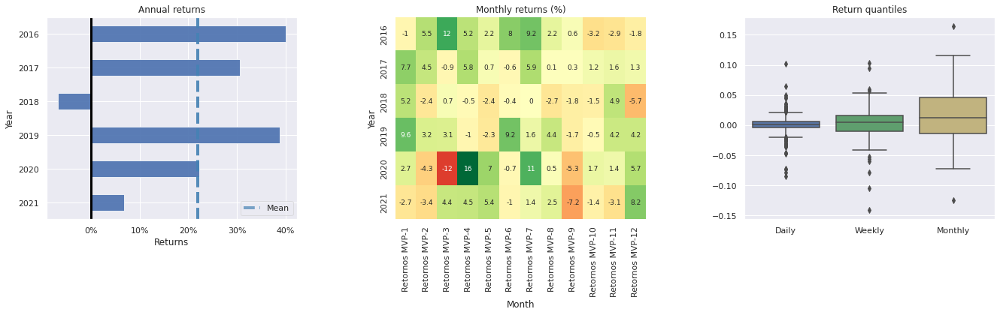

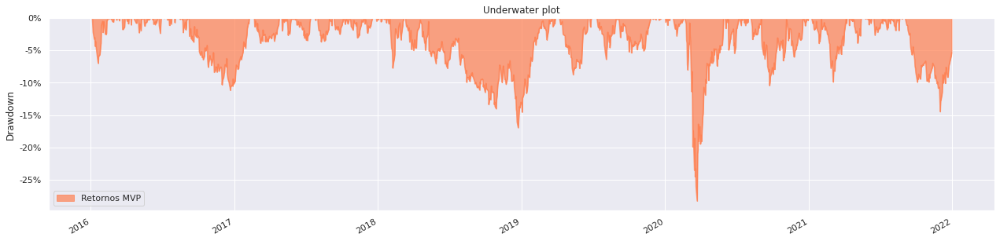



O retorno total na carteira IVP é igual a 233.62%
O retorno anual na carteira IVP é igual a 21.89%
A volatilidade anual da carteira IVP é igual a 18.71%
O Sharpe Ratio da carteira IVP é igual a 1.17
O MDD da carteira IVP é igual a -36.98%
O Beta da carteira IVP em relação ao Ibovespa é igual a 0.4925
E em relaçao ao S&P500 é igual a 0.8738 



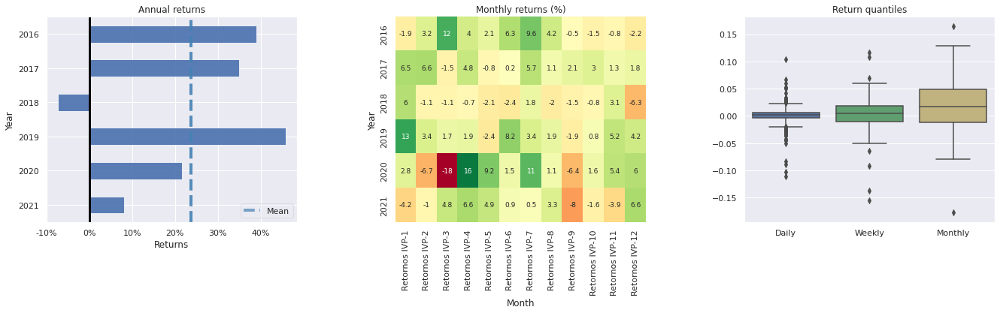

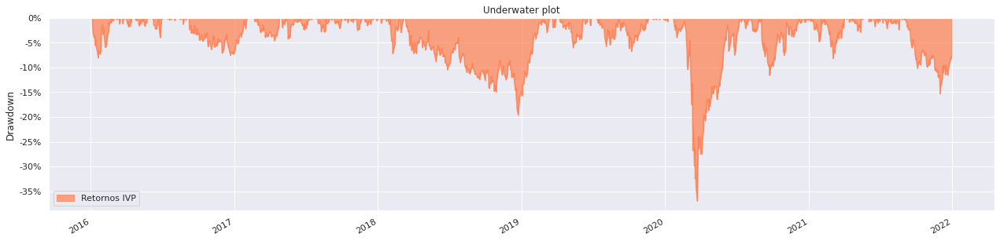



O retorno total na carteira HRP é igual a 237.27%
O retorno anual na carteira HRP é igual a 22.0%
A volatilidade anual da carteira HRP é igual a 18.31%
O Sharpe Ratio da carteira HRP é igual a 1.202
O MDD da carteira HRP é igual a -34.84%
O Beta da carteira HRP em relação ao Ibovespa é igual a 0.4707
E em relaçao ao S&P500 é igual a 0.8328 



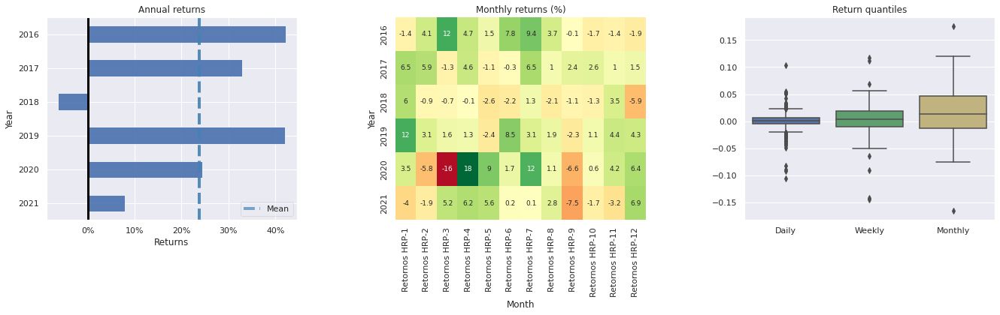

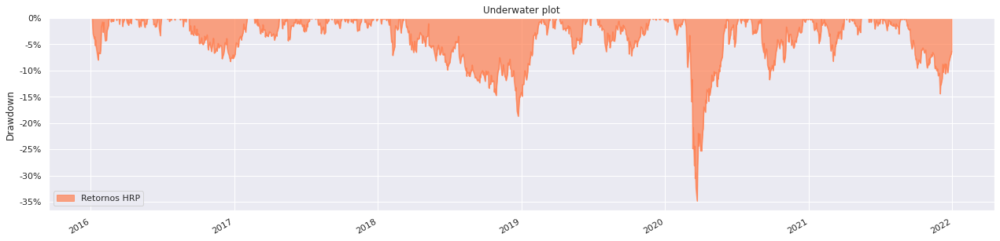



O retorno total do Ibovespa é igual a 100.03%
O retorno total do S&P500 é igual a 114.2%


,Retornos MVP,Retornos IVP,Retornos HRP,MDD 30d MVP,MDD 30d IVP,MDD 30d HRP,Ibovespa,S&P500
Date,,,,,,,,
2016-01-05,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.006575,1.002010
2016-01-06,1.001245,1.003178,1.003501,NaN,NaN,NaN,0.991128,0.988782
2016-01-07,0.990743,0.982820,0.984819,NaN,NaN,NaN,0.965215,0.965065
2016-01-08,0.979368,0.970929,0.973032,NaN,NaN,NaN,0.963245,0.954548
2016-01-11,0.969001,0.963726,0.963607,NaN,NaN,NaN,0.947414,0.955362
...,...,...,...,...,...,...,...,...
2021-12-23,3.017569,3.263725,3.297672,4.248154e-14,4.701767e-15,5.412155e-15,2.001842,2.118505
2021-12-27,3.052682,3.308916,3.342082,4.151923e-14,4.596392e-15,5.286776e-15,2.014019,2.147622
2021-12-28,3.060842,3.316413,3.349739,4.057872e-14,4.493379e-15,5.164302e-15,2.001250,2.145451


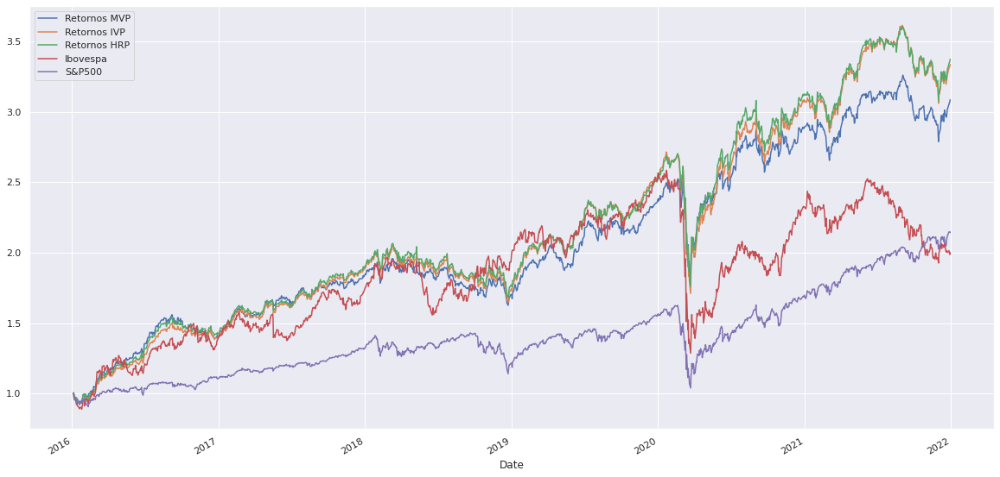

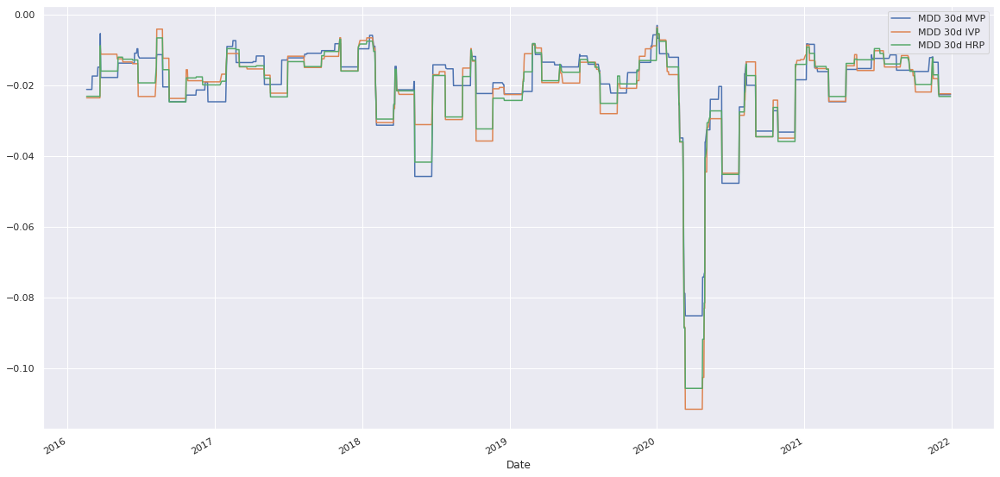

In [454]:
portfolio, portfolios_acum, plot, plot2, individual_returns_anualized = combine_returns_weights(['MVP','IVP','HRP'])
portfolios_acum

In [455]:
individual_returns_anualized

,0
BLK,0.193348
FB,0.202829
MKTX,0.228758
ABMD,0.241536
WAT,0.175130
NEM,0.221610
FLRY3,0.183066
ELET3,0.338424
ELET6,0.253208
VIIA3,0.247450


In [456]:
teste = portfolio.merge(bench,left_index=True,right_index=True)

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,20.701%
Cumulative returns,208.529%
Annual volatility,17.205%
Sharpe ratio,1.18
Calmar ratio,0.73
Stability,0.93
Max drawdown,-28.269%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,28.27,2020-02-20,2020-03-23,2020-05-29,72
1,16.96,2018-03-12,2018-12-24,2019-03-21,269
2,14.47,2021-09-03,2021-12-01,NaT,NaN
3,11.17,2016-09-07,2016-12-22,2017-02-08,111
4,10.44,2020-09-02,2020-09-23,2020-12-17,77


Stress Events,mean,min,max
New Normal,0.08%,-8.51%,10.21%


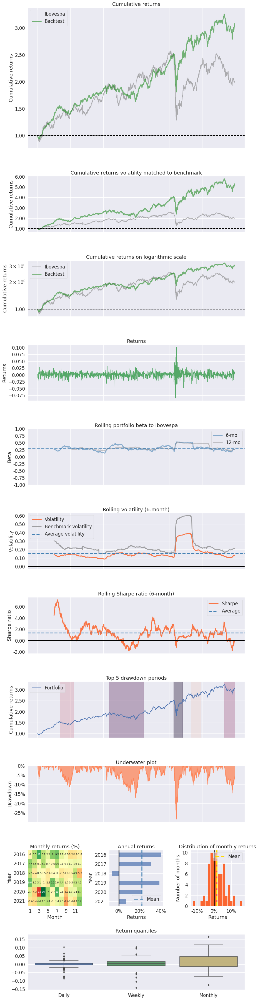

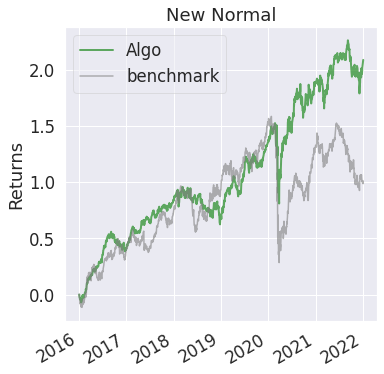

In [457]:
pf.create_full_tear_sheet(teste["Retornos MVP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.287%
Cumulative returns,233.617%
Annual volatility,18.711%
Sharpe ratio,1.17
Calmar ratio,0.60
Stability,0.94
Max drawdown,-36.983%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.98,2020-01-22,2020-03-23,2020-07-09,122
1,19.61,2018-03-12,2018-12-24,2019-03-13,263
2,15.30,2021-09-01,2021-12-01,NaT,NaN
3,11.57,2020-09-02,2020-09-23,2020-12-08,70
4,8.17,2021-02-02,2021-03-04,2021-04-01,43


Stress Events,mean,min,max
New Normal,0.09%,-11.15%,10.46%


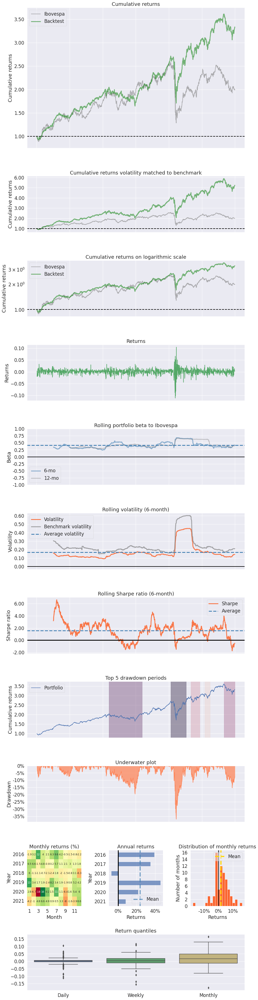

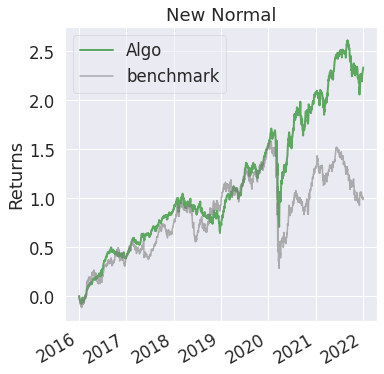

In [458]:
pf.create_full_tear_sheet(teste["Retornos IVP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.51%
Cumulative returns,237.271%
Annual volatility,18.306%
Sharpe ratio,1.20
Calmar ratio,0.65
Stability,0.94
Max drawdown,-34.844%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,34.84,2020-02-20,2020-03-23,2020-06-08,78
1,18.70,2018-03-12,2018-12-24,2019-02-25,251
2,14.43,2021-09-03,2021-12-01,NaT,NaN
3,11.75,2020-09-02,2020-09-23,2020-12-17,77
4,8.28,2016-09-08,2016-12-22,2017-02-03,107


Stress Events,mean,min,max
New Normal,0.09%,-10.56%,10.33%


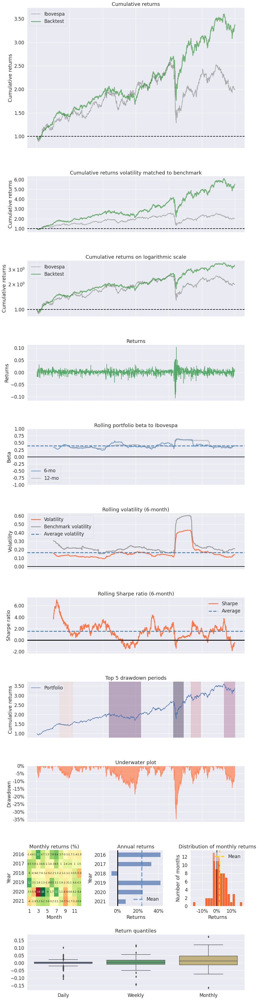

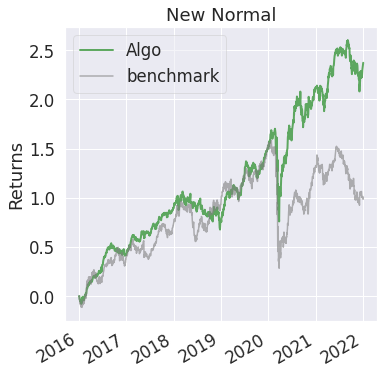

In [459]:
pf.create_full_tear_sheet(teste["Retornos HRP"], benchmark_rets=teste["Ibovespa"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,20.701%
Cumulative returns,208.529%
Annual volatility,17.205%
Sharpe ratio,1.18
Calmar ratio,0.73
Stability,0.93
Max drawdown,-28.269%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,28.27,2020-02-20,2020-03-23,2020-05-29,72
1,16.96,2018-03-12,2018-12-24,2019-03-21,269
2,14.47,2021-09-03,2021-12-01,NaT,NaN
3,11.17,2016-09-07,2016-12-22,2017-02-08,111
4,10.44,2020-09-02,2020-09-23,2020-12-17,77


Stress Events,mean,min,max
New Normal,0.08%,-8.51%,10.21%


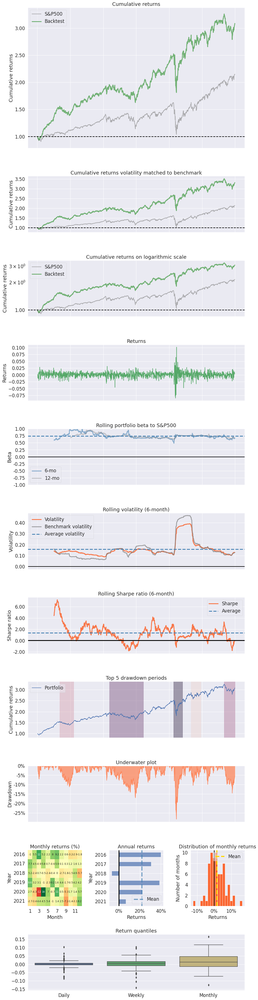

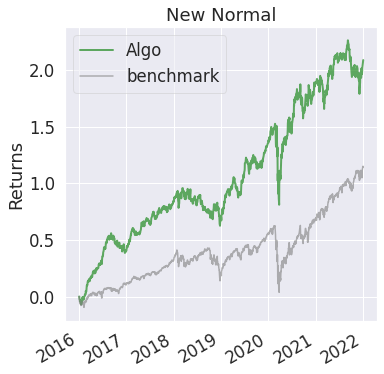

In [460]:
pf.create_full_tear_sheet(teste["Retornos MVP"], benchmark_rets=teste["S&P500"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.287%
Cumulative returns,233.617%
Annual volatility,18.711%
Sharpe ratio,1.17
Calmar ratio,0.60
Stability,0.94
Max drawdown,-36.983%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.98,2020-01-22,2020-03-23,2020-07-09,122
1,19.61,2018-03-12,2018-12-24,2019-03-13,263
2,15.30,2021-09-01,2021-12-01,NaT,NaN
3,11.57,2020-09-02,2020-09-23,2020-12-08,70
4,8.17,2021-02-02,2021-03-04,2021-04-01,43


Stress Events,mean,min,max
New Normal,0.09%,-11.15%,10.46%


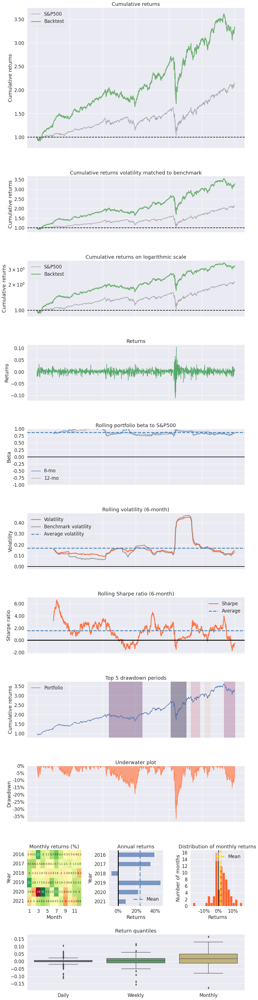

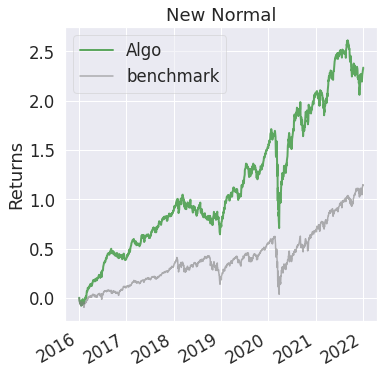

In [461]:
pf.create_full_tear_sheet(teste["Retornos IVP"], benchmark_rets=teste["S&P500"])

Start date,2016-01-05
End date,2021-12-30
Total months,71
,Backtest
Annual return,22.51%
Cumulative returns,237.271%
Annual volatility,18.306%
Sharpe ratio,1.20
Calmar ratio,0.65
Stability,0.94
Max drawdown,-34.844%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,34.84,2020-02-20,2020-03-23,2020-06-08,78
1,18.70,2018-03-12,2018-12-24,2019-02-25,251
2,14.43,2021-09-03,2021-12-01,NaT,NaN
3,11.75,2020-09-02,2020-09-23,2020-12-17,77
4,8.28,2016-09-08,2016-12-22,2017-02-03,107


Stress Events,mean,min,max
New Normal,0.09%,-10.56%,10.33%


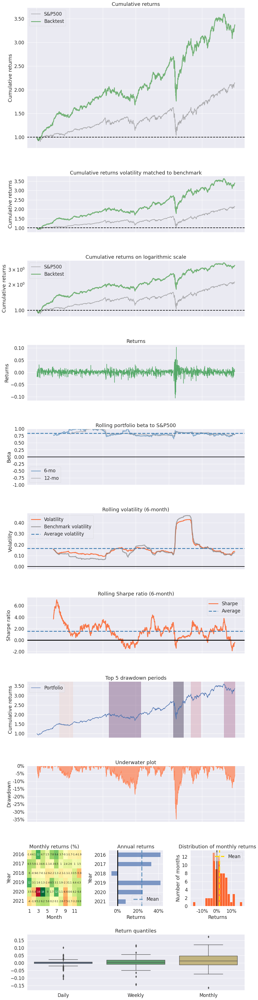

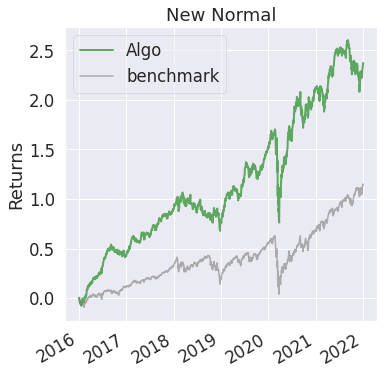

In [462]:
pf.create_full_tear_sheet(teste["Retornos HRP"], benchmark_rets=teste["S&P500"])

##Secundary tests (não precisa rodar)

In [463]:
portfolio_order = portfolios.T.iloc[:-2].reindex(columns=log_returns.columns)
portfolio_order

,BLK,FB,MKTX,ABMD,WAT,NEM,FLRY3,ELET3,ELET6,VIIA3,POSI3,VRSK,PRIO3,BPAN4,NLOK
MVP,0.011887,0.034797,0.093592,0.041146,0.157547,0.179156,0.119283,0.003966,0.009468,0.001981,0.009012,0.213455,0.002293,0.012916,0.1095
IVP,0.111943,0.083728,0.090564,0.051679,0.123591,0.074923,0.080734,0.02596,0.034491,0.019585,0.020788,0.168285,0.016231,0.023861,0.073636
HRP,0.084586,0.073152,0.079125,0.070194,0.093387,0.119248,0.073739,0.026519,0.032594,0.017888,0.019696,0.171909,0.015339,0.022608,0.100017


In [464]:
ativos = np.array(log_returns.columns)
pesos_mvp = np.array(portfolio_order.loc['MVP'])
pesos_ivp = np.array(portfolio_order.loc['IVP'])
pesos_hrp = np.array(portfolio_order.loc['HRP'])

In [465]:
carteira_mvp = pd.DataFrame((log_returns * pesos_mvp).sum(axis=1)).rename(columns={0:'Retornos MVP'})
carteira_ivp = pd.DataFrame((log_returns * pesos_ivp).sum(axis=1)).rename(columns={0:'Retornos IVP'})
carteira_hrp = pd.DataFrame((log_returns * pesos_hrp).sum(axis=1)).rename(columns={0:'Retornos HRP'})

In [466]:
carteira_mvp_vol=np.sqrt(pesos_ivp.T.dot(covariancia).dot(pesos_ivp))
carteira_mvp_vol

0.011786594871360058

In [467]:
expected_return_annual_mvp = np.sum(carteira_mvp.mean()*252)
expected_return_annual_mvp

0.2030602467166688

In [468]:
individual_returns_anualized=log_returns.mean()*252
individual_returns_anualized=individual_returns_anualized.to_frame()
individual_returns_anualized.rename(columns={0:"Anual Returns %"}).sort_values(by = "Anual Returns %", ascending=False)

,Anual Returns %
PRIO3,0.751217
ELET3,0.338424
POSI3,0.326942
BPAN4,0.316293
ELET6,0.253208
VIIA3,0.247450
ABMD,0.241536
MKTX,0.228758
NEM,0.221610
FB,0.202829


In [469]:
individual_returns_anualized.iloc[-1,:]

0    0.18307
Name: NLOK, dtype: float64

In [470]:
portfolios_methods = carteira_mvp.merge(carteira_ivp,left_index = True, right_index = True).merge(carteira_hrp,left_index = True, right_index = True)
portfolios_methods

,Retornos MVP,Retornos IVP,Retornos HRP
Date,,,
2016-01-05,0.001668,0.003791,0.003438
2016-01-06,-0.000422,-0.000610,0.000063
2016-01-07,-0.010489,-0.020294,-0.018616
2016-01-08,-0.011482,-0.012099,-0.011970
2016-01-11,-0.010585,-0.007418,-0.009686
...,...,...,...
2021-12-23,0.007747,0.005956,0.007203
2021-12-27,0.011636,0.013847,0.013467
2021-12-28,0.002673,0.002266,0.002291


In [471]:
portfolios_methods_acum = (1+portfolios_methods).cumprod()
# portfolios_methods_acum.iloc[0] = 1
portfolios_methods_acum

,Retornos MVP,Retornos IVP,Retornos HRP
Date,,,
2016-01-05,1.001668,1.003791,1.003438
2016-01-06,1.001245,1.003178,1.003501
2016-01-07,0.990743,0.982820,0.984819
2016-01-08,0.979368,0.970929,0.973032
2016-01-11,0.969001,0.963726,0.963607
...,...,...,...
2021-12-23,3.017569,3.263725,3.297672
2021-12-27,3.052682,3.308916,3.342082
2021-12-28,3.060842,3.316413,3.349739


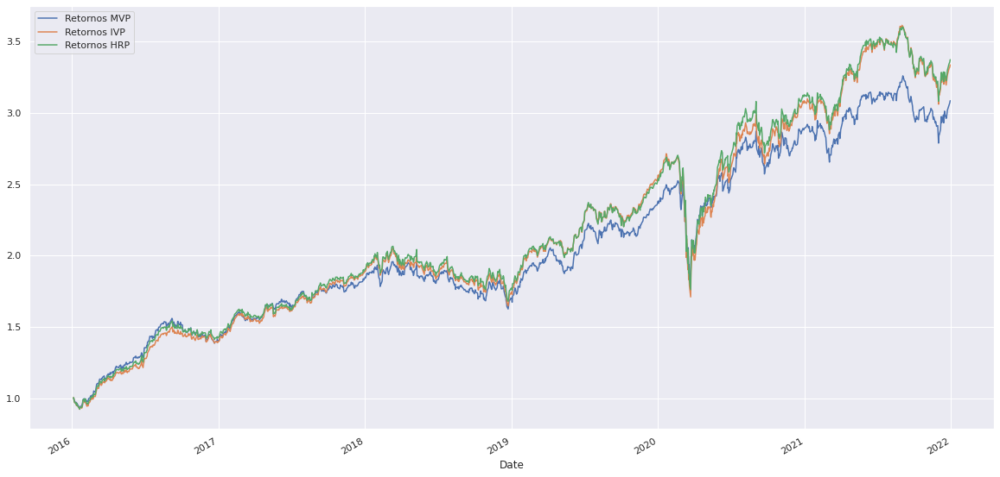

In [472]:
portfolios_methods_acum[['Retornos MVP','Retornos IVP','Retornos HRP']].plot(figsize = (20,10));

In [473]:
#Drawdown 30 dias 

portfolios_methods['MDD 30d MVP'] = portfolios_methods['Retornos MVP'].rolling(window=30).min()
portfolios_methods['MDD 30d IVP'] = portfolios_methods['Retornos IVP'].rolling(window=30).min()
portfolios_methods['MDD 30d HRP'] = portfolios_methods['Retornos HRP'].rolling(window=30).min()

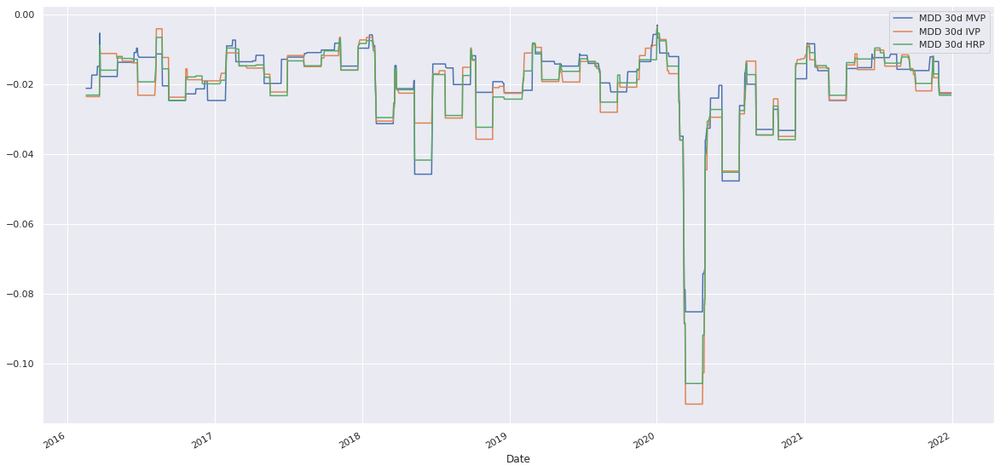

In [474]:
portfolios_methods[['MDD 30d MVP','MDD 30d IVP','MDD 30d HRP']].plot(figsize = (20,10));

In [475]:
bench

,Ibovespa,S&P500
Date,,
2016-01-05,0.006575,0.002010
2016-01-06,-0.015346,-0.013202
2016-01-07,-0.026145,-0.023986
2016-01-08,-0.002042,-0.010898
2016-01-11,-0.016435,0.000853
...,...,...
2021-12-23,-0.003360,0.006204
2021-12-27,0.006083,0.013744
2021-12-28,-0.006340,-0.001011


In [476]:
bench_acum

,Ibovespa,S&P500
Date,,
2016-01-05,1.006575,1.002010
2016-01-06,0.991128,0.988782
2016-01-07,0.965215,0.965065
2016-01-08,0.963245,0.954548
2016-01-11,0.947414,0.955362
...,...,...
2021-12-23,2.001842,2.118505
2021-12-27,2.014019,2.147622
2021-12-28,2.001250,2.145451


In [477]:
portfolios_methods_acum = portfolios_methods_acum.merge(bench_acum,left_index=True,right_index=True)
# portfolios_methods_acum.iloc[0] = 1
# portfolios_methods_acum = 10000 * portfolios_methods_acum
# portfolios_methods_acum['teste'] = portfolios_methods_acum["Retornos MVP"].pct_change()
# portfolios_methods_acum

In [478]:
portfolios_methods_acum

,Retornos MVP,Retornos IVP,Retornos HRP,Ibovespa,S&P500
Date,,,,,
2016-01-05,1.001668,1.003791,1.003438,1.006575,1.002010
2016-01-06,1.001245,1.003178,1.003501,0.991128,0.988782
2016-01-07,0.990743,0.982820,0.984819,0.965215,0.965065
2016-01-08,0.979368,0.970929,0.973032,0.963245,0.954548
2016-01-11,0.969001,0.963726,0.963607,0.947414,0.955362
...,...,...,...,...,...
2021-12-23,3.017569,3.263725,3.297672,2.001842,2.118505
2021-12-27,3.052682,3.308916,3.342082,2.014019,2.147622
2021-12-28,3.060842,3.316413,3.349739,2.001250,2.145451


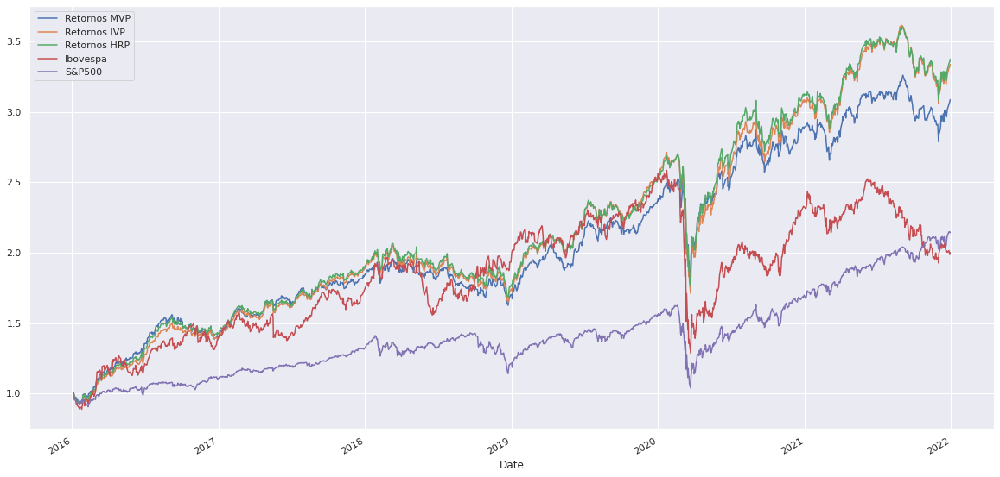

In [479]:
portfolios_methods_acum.plot(figsize = (20,10));